# 1. download datasets from DataFed

In [8]:
# transfer ds to nhi-gpu
import pandas as pd
import json # For dealing with metadata
import os # For file level operations
from datafed.CommandLib import API
df_api = API()

ls_resp = df_api.collectionItemsList('c/393370045')
print(ls_resp)

(item {
  id: "d/393623654"
  title: "STO_STO_test3_04082022"
  owner: "p/2022_pld_plume_recording"
  creator: "u/inm3l"
  size: 157050474496.0
  notes: 0
}
item {
  id: "d/396938316"
  title: "STO_STO_test4_05192022"
  owner: "p/2022_pld_plume_recording"
  creator: "u/inm3l"
  size: 42758311936.0
  notes: 0
}
item {
  id: "d/398450311"
  title: "STO_STO_test5_06062022"
  owner: "p/2022_pld_plume_recording"
  creator: "u/inm3l"
  size: 208252440576.0
  notes: 0
}
item {
  id: "d/400460226"
  title: "STO_STO_test6_06292022"
  owner: "p/2022_pld_plume_recording"
  creator: "u/inm3l"
  size: 409411262464.0
  notes: 0
}
item {
  id: "d/403755259"
  title: "STO_STO_test6_06292022_small"
  owner: "p/2022_pld_plume_recording"
  creator: "u/inm3l"
  size: 28112046144.0
  notes: 0
}
item {
  id: "d/400569828"
  title: "STO_STO_test7_06292022"
  owner: "p/2022_pld_plume_recording"
  creator: "u/inm3l"
  size: 48273846144.0
  notes: 0
}
item {
  id: "d/402872154"
  title: "STO_STO_test8_07122022"

In [200]:
# sample 1
dv_resp = df_api.dataView('d/403755259')
id_index = dv_resp[0].data[0].id
get_resp = df_api.dataGet(id_index, '/scratch/yichen/RHEED_data/', orig_fname=True, wait=True)
get_resp

(task {
   id: "task/400460933"
   type: TT_DATA_GET
   status: TS_SUCCEEDED
   client: "u/yig319"
   step: 2
   steps: 3
   msg: "Finished"
   ct: 1656603683
   ut: 1656609276
   source: "d/400393227"
   dest: "lehigh#nhi-gpu/scratch/yichen/RHEED_data"
 },
 'TaskDataReply')

In [ ]:
# sample 2
dv_resp = df_api.dataView('d/400569828')
id_index = dv_resp[0].data[0].id
get_resp = df_api.dataGet(id_index, '/scratch/yichen/RHEED_data/', orig_fname=True, wait=True)
get_resp

In [ ]:
# sample 3
dv_resp = df_api.dataView('d/403087357')
id_index = dv_resp[0].data[0].id
get_resp = df_api.dataGet(id_index, '/scratch/yichen/RHEED_data/', orig_fname=True, wait=True)
get_resp

# 2. Process images to get RHEED intensity data

In [1]:
import os, glob, h5py, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
sys.path.append('../')
from analyze_RHEED_spot_functions import show_metrics, Gaussian, generate_parameter_file, show_sound, show_fft_frequency, butter_filter, process_pass_filter
from analyze_RHEED_intensity_functions import NormalizeData, trim_axes, show_images, show_plots

## 2.1 Sample 1 - TiO2 treated substrate with wide step width (0.43±0.04μm)

### 2.1.1 Information about dataset

In [2]:
RHEED_spot_file = '/scratch/yichen/RHEED_data/STO_STO_test6_06292022.h5'
with h5py.File(RHEED_spot_file, mode='r') as h5:
    print('Key parameters:', list(h5.keys()))
    print('Size of data:', h5['growth_2'].shape)

Key parameters: ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']
Size of data: (12858, 1024, 1280)


### 2.1.2 Locate the spots

<IPython.core.display.Javascript object>


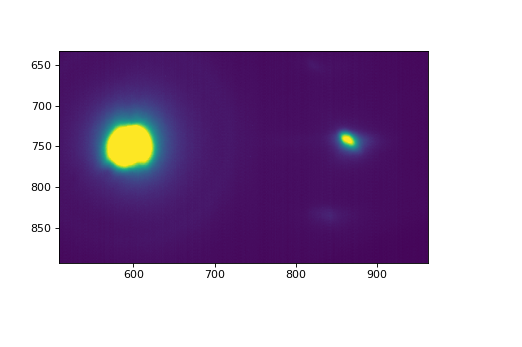

In [7]:
%matplotlib notebook
with h5py.File(RHEED_spot_file, mode='r') as h5:
    img = np.array(h5['growth_2'][0])
plt.imshow(img)
plt.show()

<HDF5 dataset "growth_2": shape (12858, 1024, 1280), type "<u2">


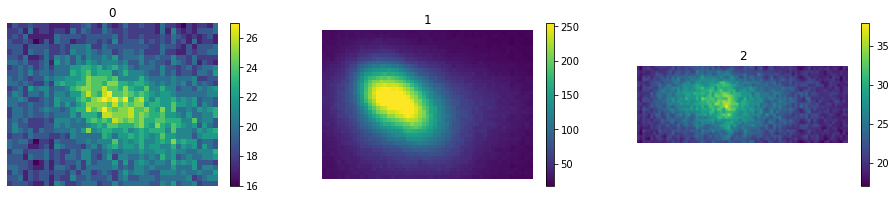

In [3]:
%matplotlib inline
frame = 10
g = 'growth_2'
spot_p = np.array([[635, 666, 802, 842], [723, 762, 845, 900], [821, 850, 809, 888]])

imgs = []
with h5py.File(RHEED_spot_file, mode='r') as h5:
    print(h5[g])
    for i in range(len(spot_p)):
        imgs.append(np.array(h5[g][frame, spot_p[i,0]:spot_p[i,1], spot_p[i,2]:spot_p[i,3]]))
show_images(imgs, colorbar=True, img_per_row=3)

### 2.1.3 Generate the metrics of spot

background_with_heater
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(2251, 31, 40) (2251, 39, 55) (2251, 29, 79)
---------------spot 0 ----------------


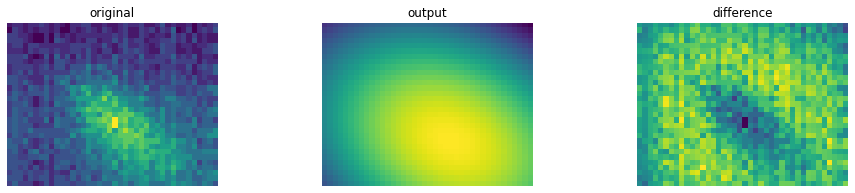

/scratch/yichen/anaconda3/envs/gyc/lib/python3.8/site-packages/scipy/optimize/minpack.py:475: RuntimeWarning: Number of calls to function has reached maxfev = 1400.
  warnings.warn(errors[info][0], RuntimeWarning)


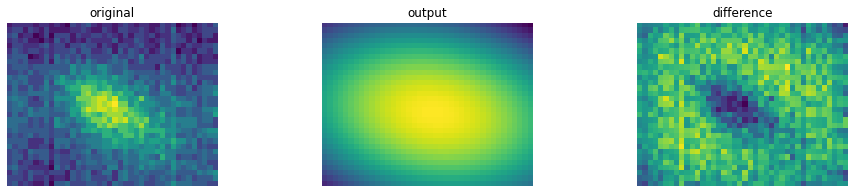

---------------spot 1 ----------------


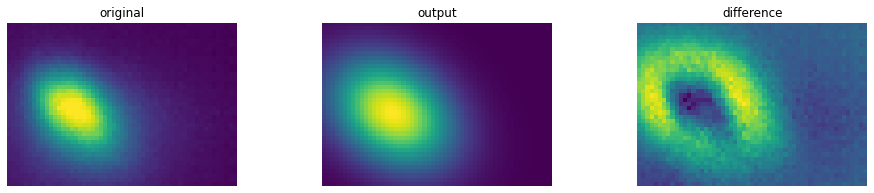

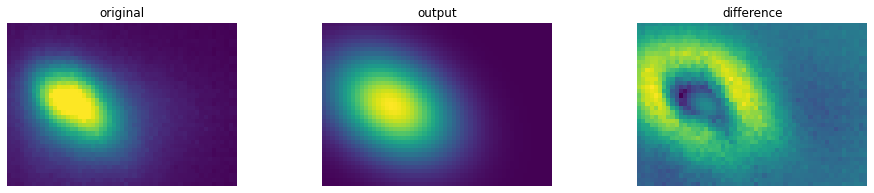

---------------spot 2 ----------------


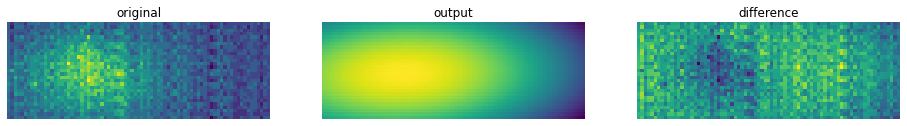

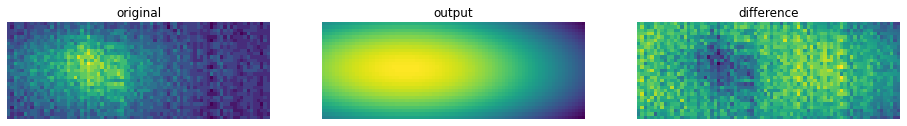

background_without_heater
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(2942, 31, 40) (2942, 39, 55) (2942, 29, 79)
---------------spot 0 ----------------


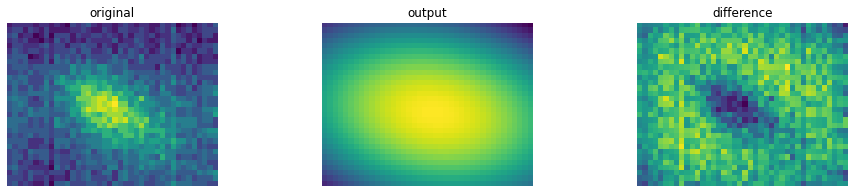

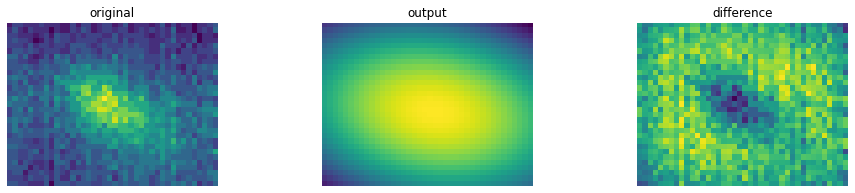

---------------spot 1 ----------------


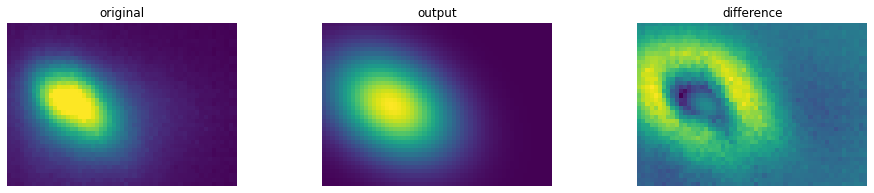

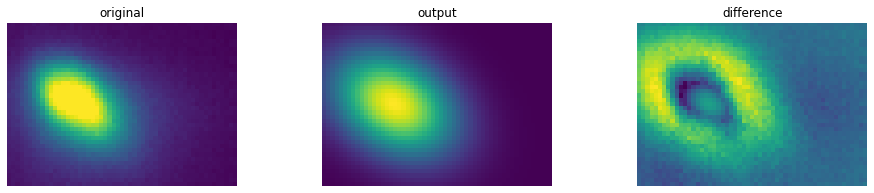

---------------spot 2 ----------------


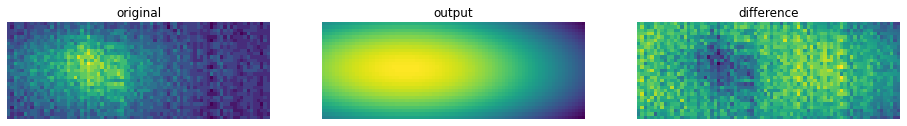

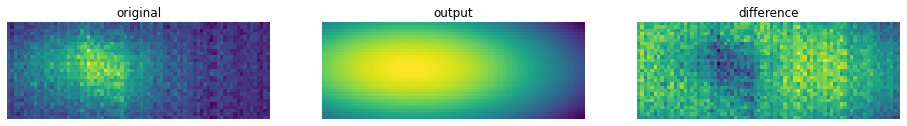

growth_1.
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(13189, 31, 40) (13189, 39, 55) (13189, 29, 79)
---------------spot 0 ----------------


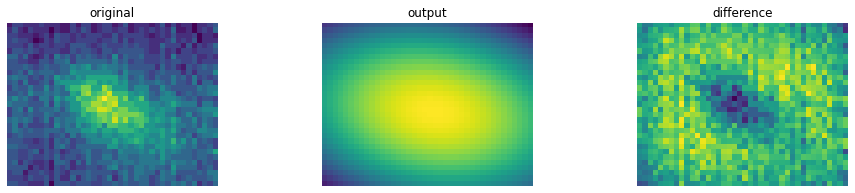

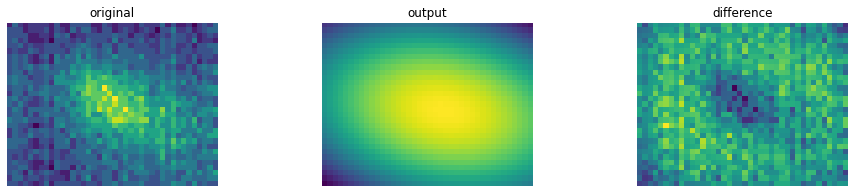

---------------spot 1 ----------------


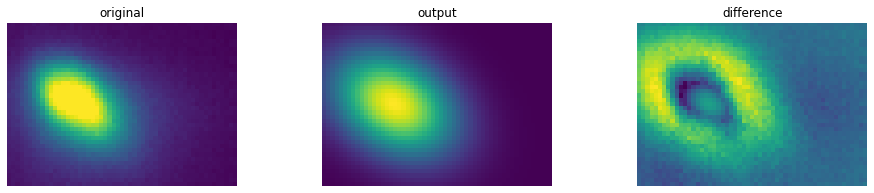

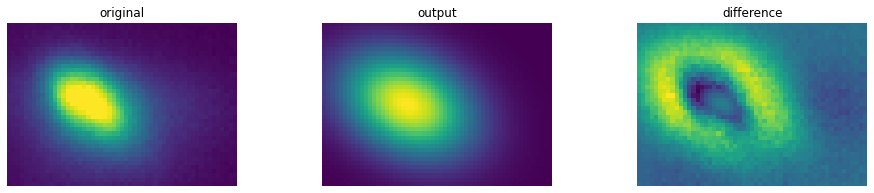

---------------spot 2 ----------------


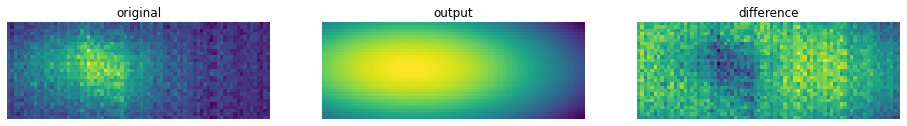

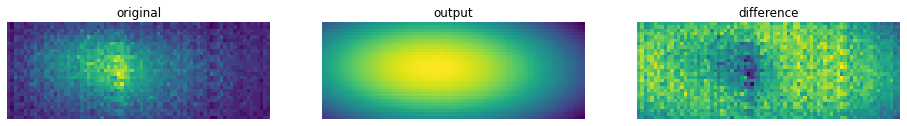

growth_2
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12858, 31, 40) (12858, 39, 55) (12858, 29, 79)
---------------spot 0 ----------------


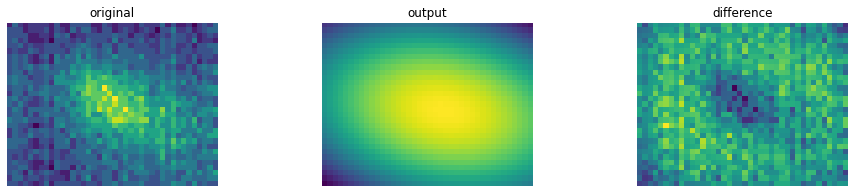

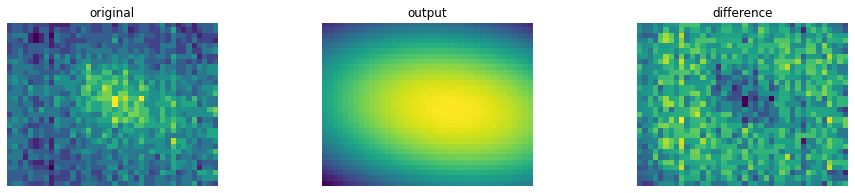

---------------spot 1 ----------------


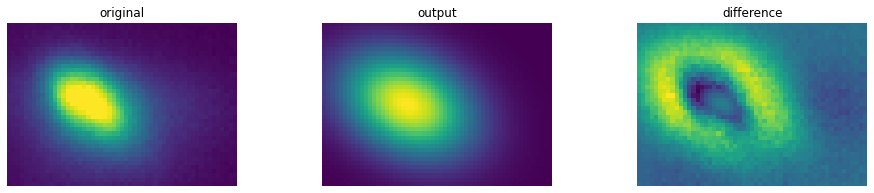

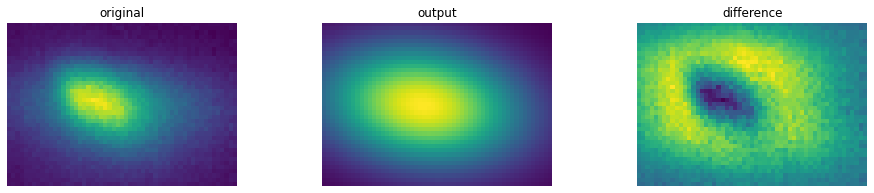

---------------spot 2 ----------------


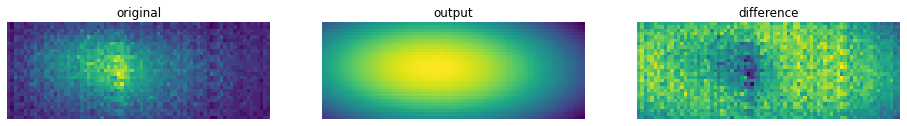

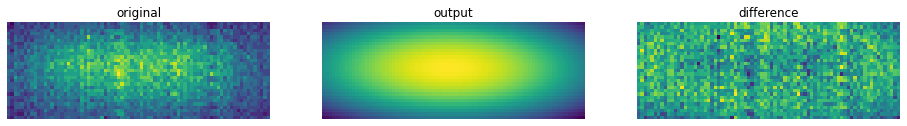

growth_3
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(11392, 31, 40) (11392, 39, 55) (11392, 29, 79)
---------------spot 0 ----------------


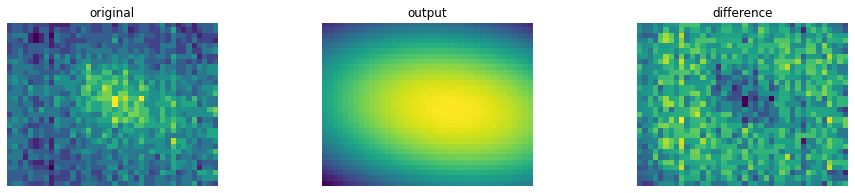

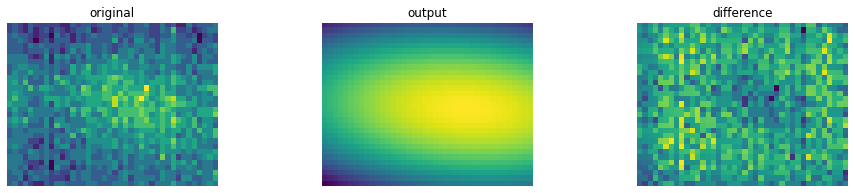

---------------spot 1 ----------------


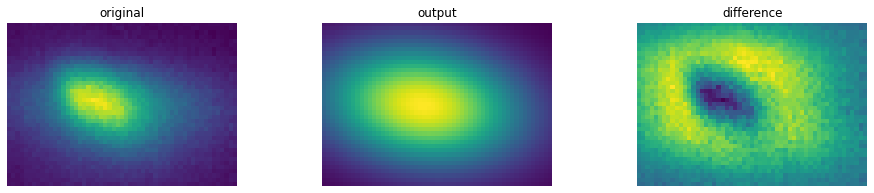

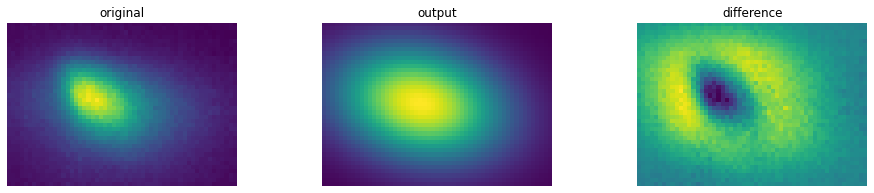

---------------spot 2 ----------------


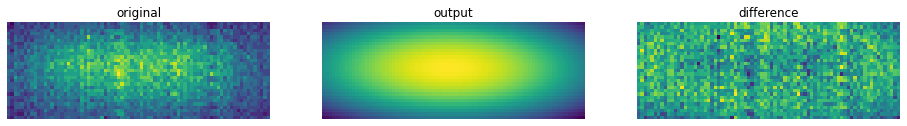

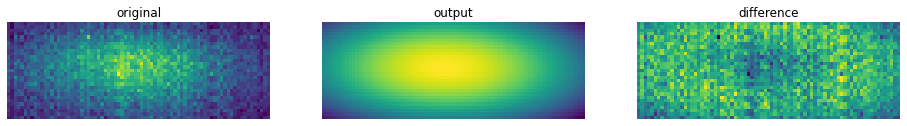

growth_4
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(13067, 31, 40) (13067, 39, 55) (13067, 29, 79)
---------------spot 0 ----------------


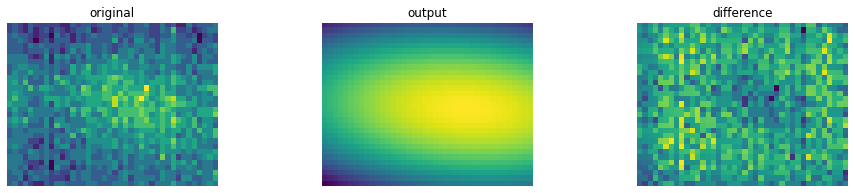

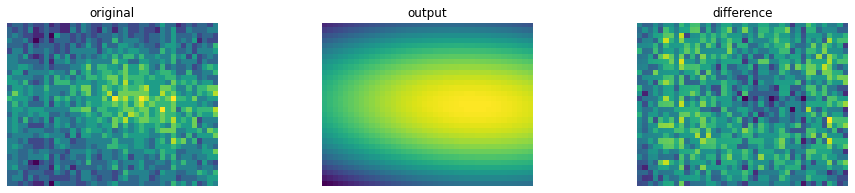

---------------spot 1 ----------------


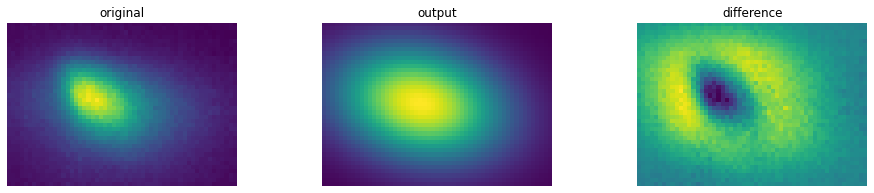

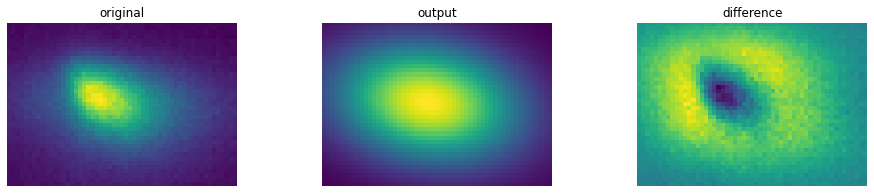

---------------spot 2 ----------------


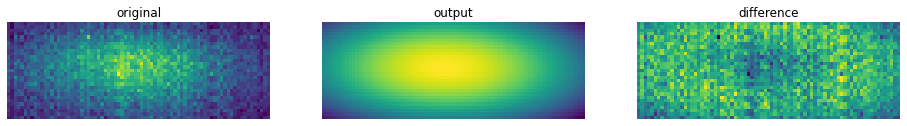

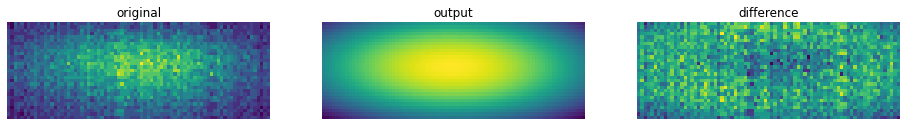

growth_5
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12619, 31, 40) (12619, 39, 55) (12619, 29, 79)
---------------spot 0 ----------------


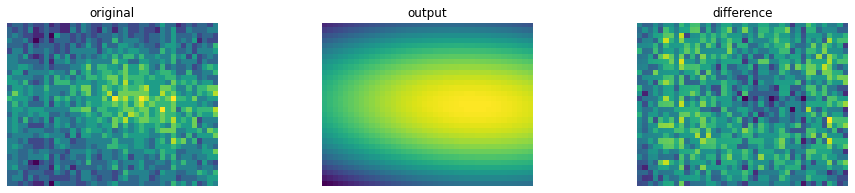

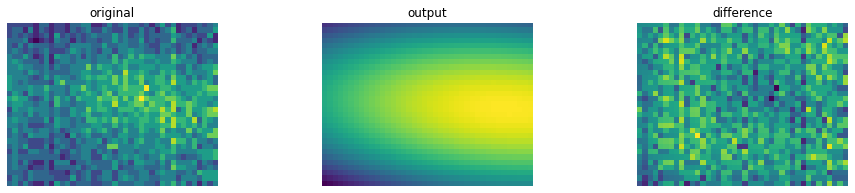

---------------spot 1 ----------------


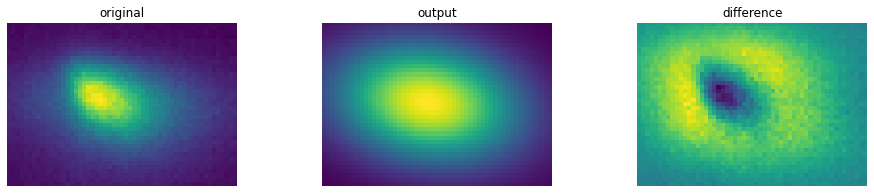

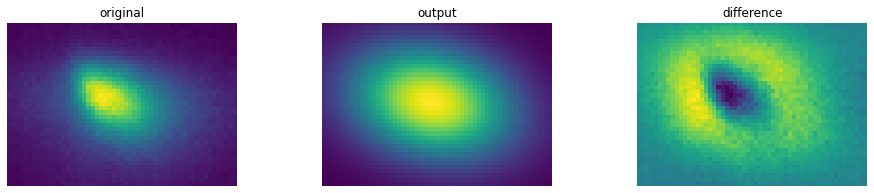

---------------spot 2 ----------------


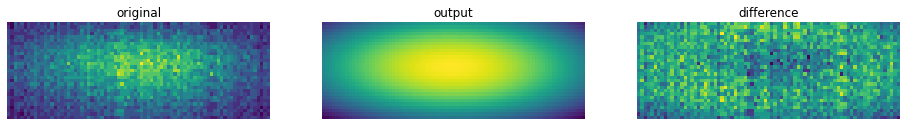

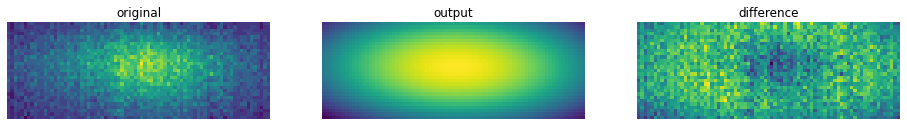

growth_6
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12610, 31, 40) (12610, 39, 55) (12610, 29, 79)
---------------spot 0 ----------------


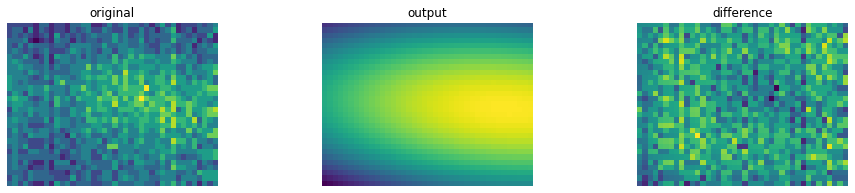

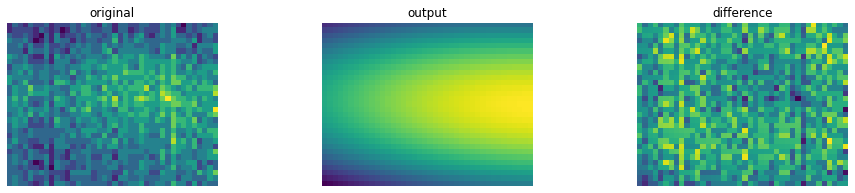

---------------spot 1 ----------------


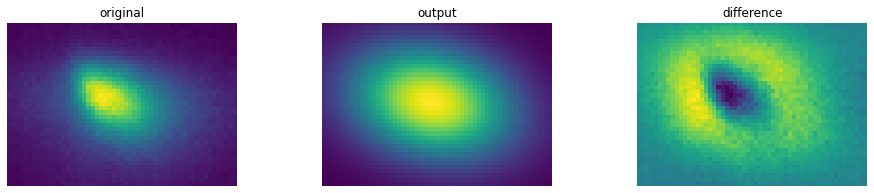

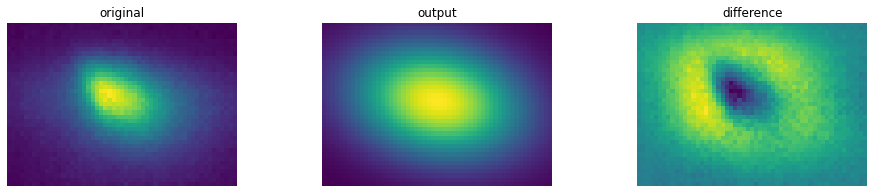

---------------spot 2 ----------------


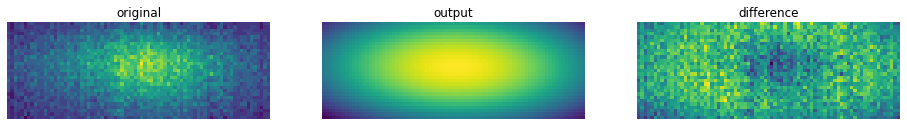

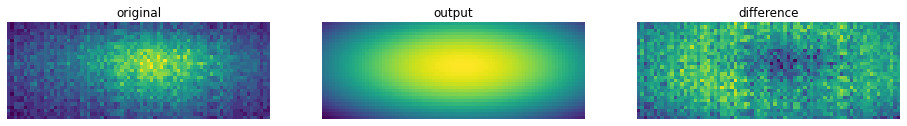

growth_7
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12431, 31, 40) (12431, 39, 55) (12431, 29, 79)
---------------spot 0 ----------------


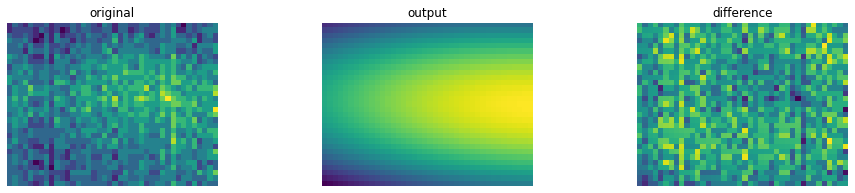

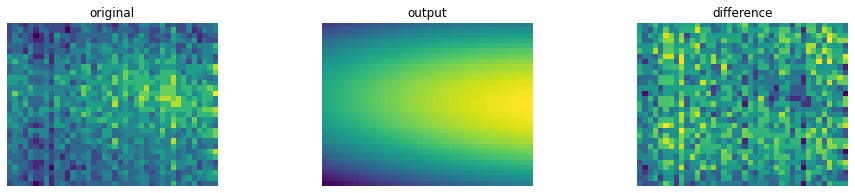

---------------spot 1 ----------------


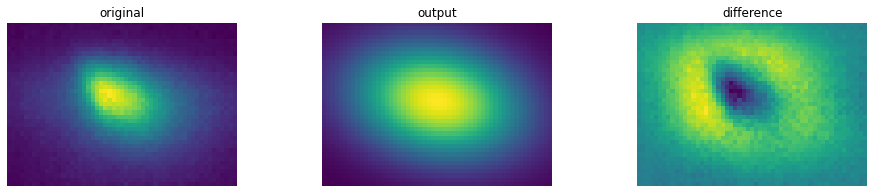

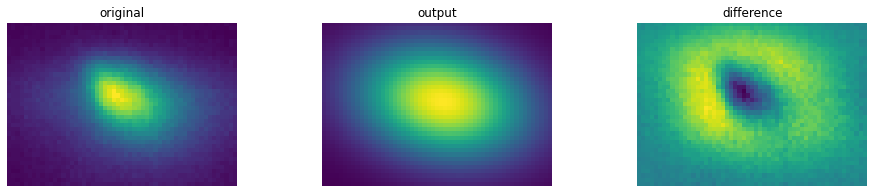

---------------spot 2 ----------------


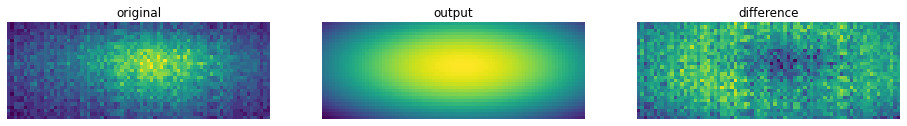

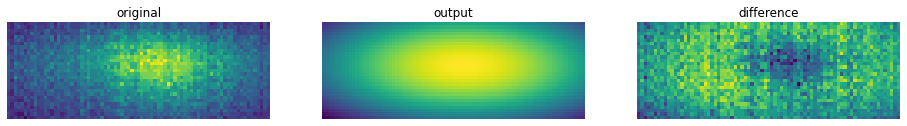

growth_8
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12553, 31, 40) (12553, 39, 55) (12553, 29, 79)
---------------spot 0 ----------------


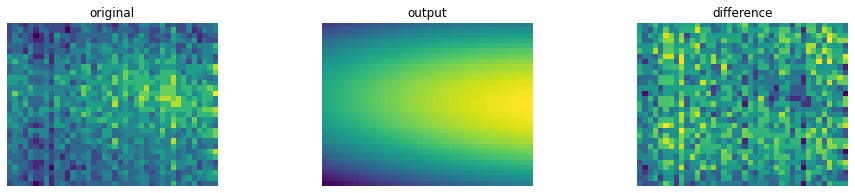

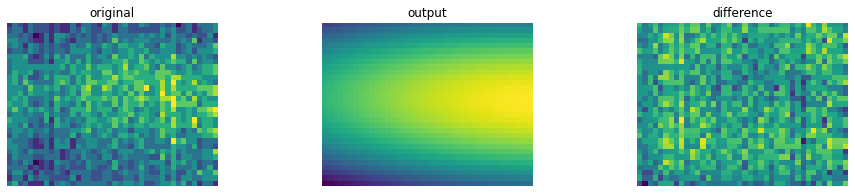

---------------spot 1 ----------------


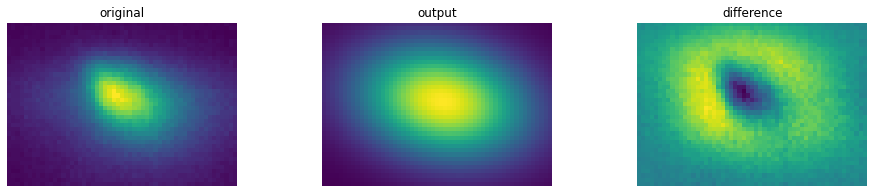

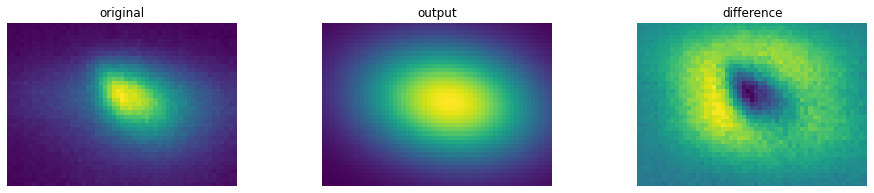

---------------spot 2 ----------------


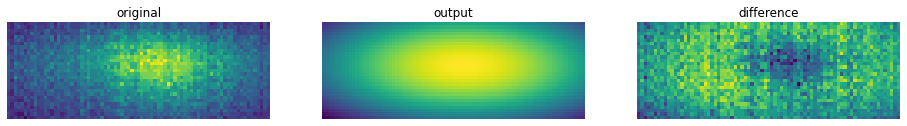

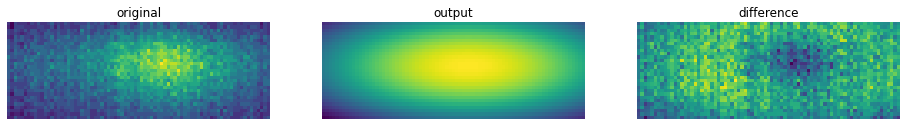

growth_9
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12568, 31, 40) (12568, 39, 55) (12568, 29, 79)
---------------spot 0 ----------------


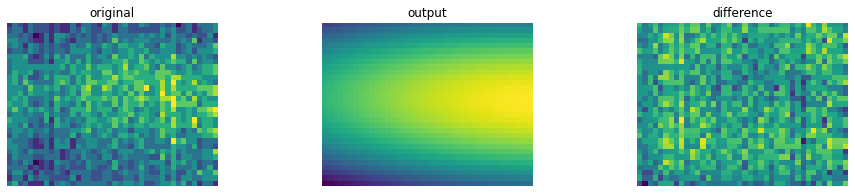

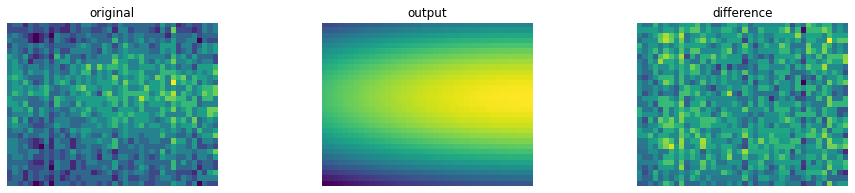

---------------spot 1 ----------------


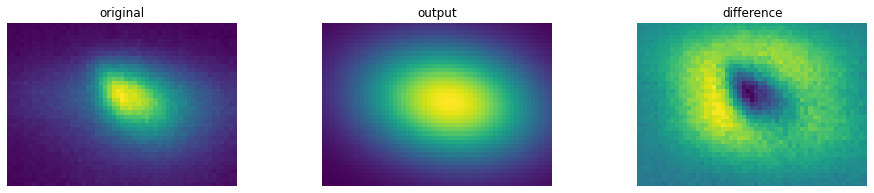

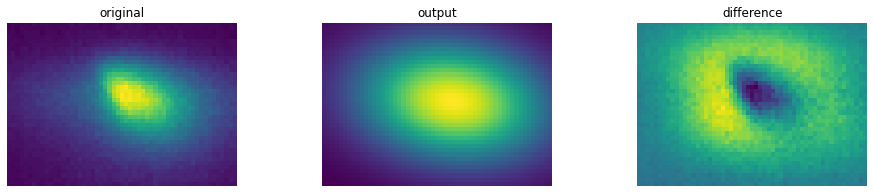

---------------spot 2 ----------------


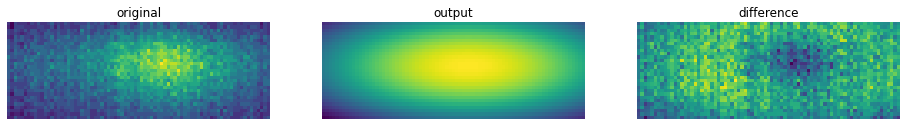

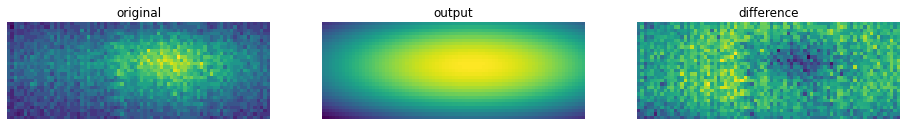

growth_10
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12336, 31, 40) (12336, 39, 55) (12336, 29, 79)
---------------spot 0 ----------------


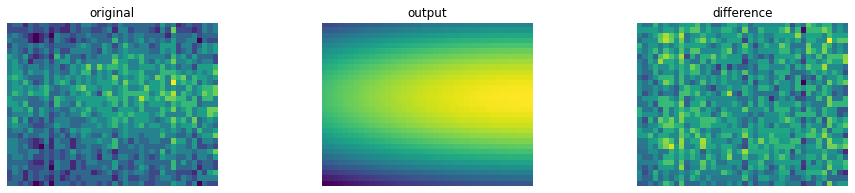

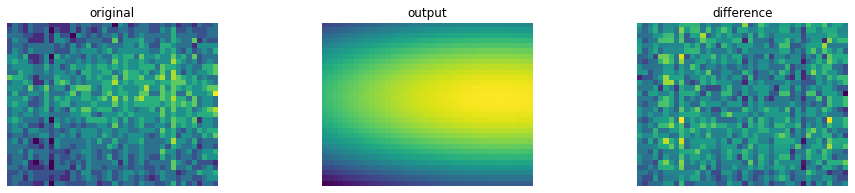

---------------spot 1 ----------------


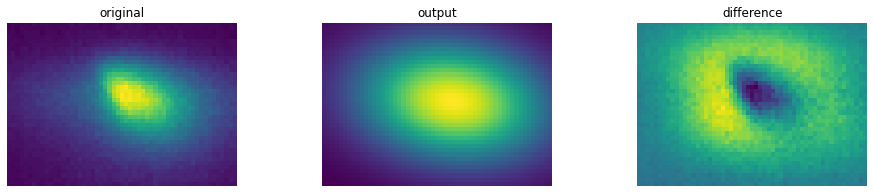

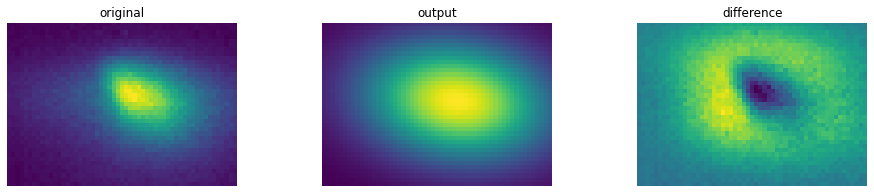

---------------spot 2 ----------------


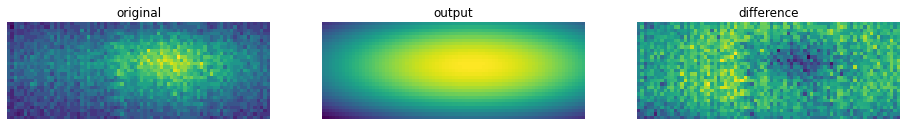

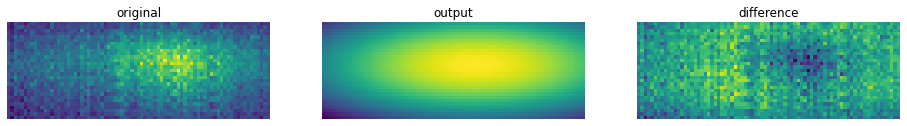

growth_11
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12799, 31, 40) (12799, 39, 55) (12799, 29, 79)
---------------spot 0 ----------------


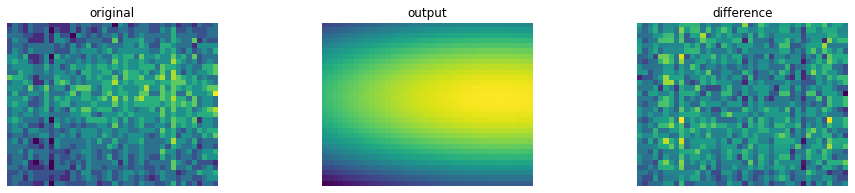

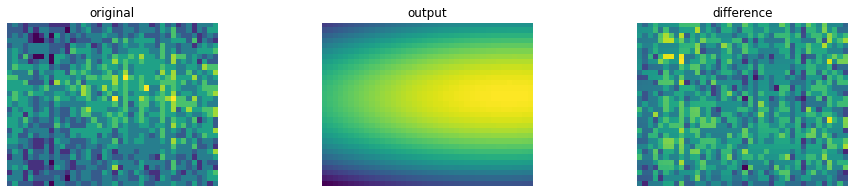

---------------spot 1 ----------------


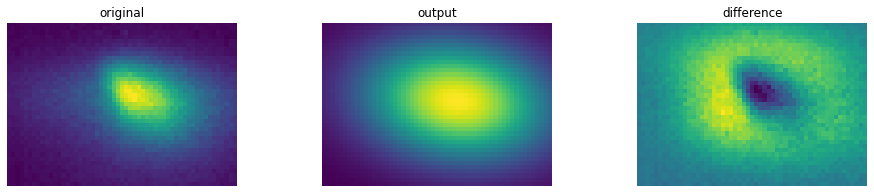

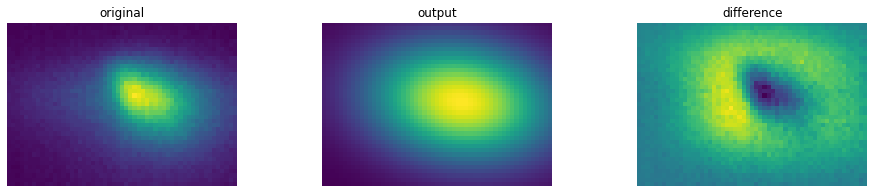

---------------spot 2 ----------------


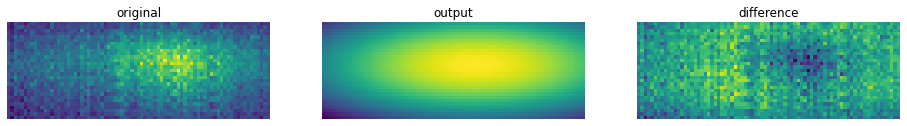

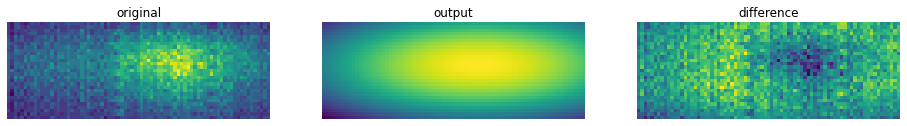

growth_12
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12563, 31, 40) (12563, 39, 55) (12563, 29, 79)
---------------spot 0 ----------------


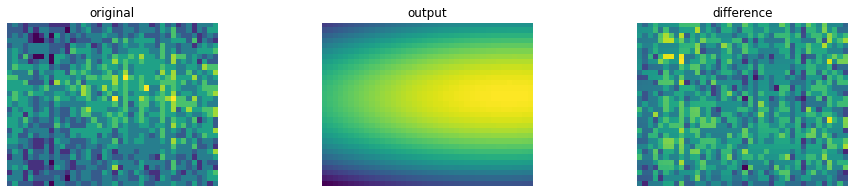

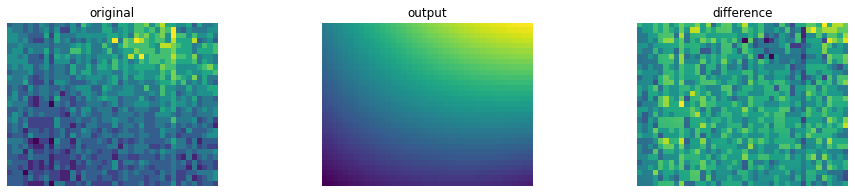

---------------spot 1 ----------------


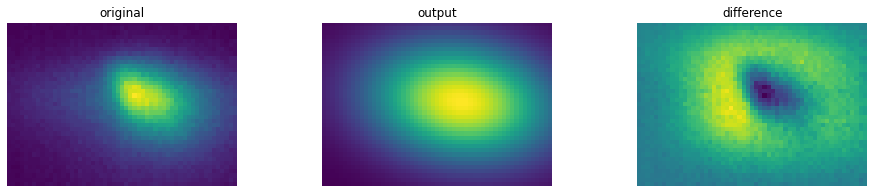

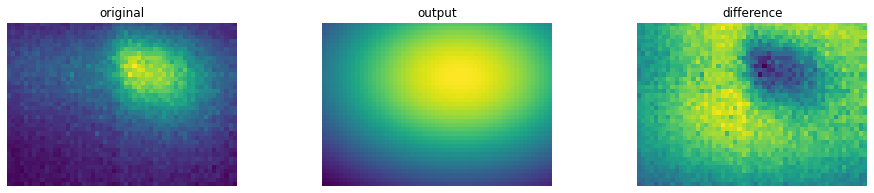

---------------spot 2 ----------------


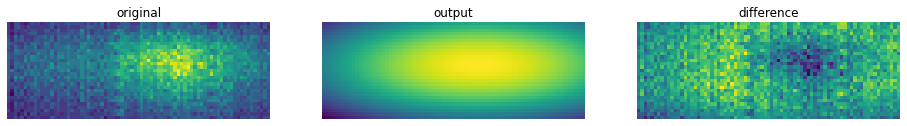

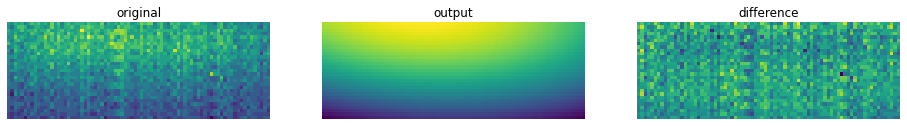

In [4]:
Parameters_file = '../data/test6_gaussian_fit_parameters_all.h5'
growth_titles = ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_2', 'growth_3', 'growth_4', 
                 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9', 'growth_10', 'growth_11', 'growth_12']
generate_parameter_file(RHEED_spot_file, Parameters_file, growth_titles, spot_p, show=True)

### 2.1.4 Upload parameter file to DataFed

In [3]:
import os # For file level operations
import json # For dealing with metadata
from datafed.CommandLib import API
df_api = API()

name = 'test6_gaussian_fit_parameters_all'
dc_resp = df_api.dataCreate(name, parent_id='c/393370045')
rec_id = dc_resp[0].data[0].id
put_resp = df_api.dataPut(rec_id, './'+name+'.h5', wait=True)
put_resp

(task {
   id: "task/402961845"
   type: TT_DATA_PUT
   status: TS_SUCCEEDED
   client: "u/yig319"
   step: 3
   steps: 4
   msg: "Finished"
   ct: 1657842467
   ut: 1657842586
   source: "lehigh#nhi-gpu/scratch/yichen/notebooks/RHEED/test6_gaussian_fit_parameters_all.h5"
   dest: "d/402961839"
 },
 'TaskDataReply')

## 2.2 Sample 2 - TiO2 treated substrate with narrow step width (0.11±0.01μm)

### 2.2.1 Information about dataset

In [12]:
RHEED_spot_file = '/scratch/yichen/RHEED_data/STO_STO_test7_06292022.h5'    
with h5py.File(RHEED_spot_file, mode='r') as h5:
    print('Key parameters:', list(h5.keys()))
    print('Size of data:', h5['growth_2'].shape)

Key parameters: ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']
Size of data: (10612, 300, 600)


### 2.2.2 Locate the spots

<IPython.core.display.Javascript object>


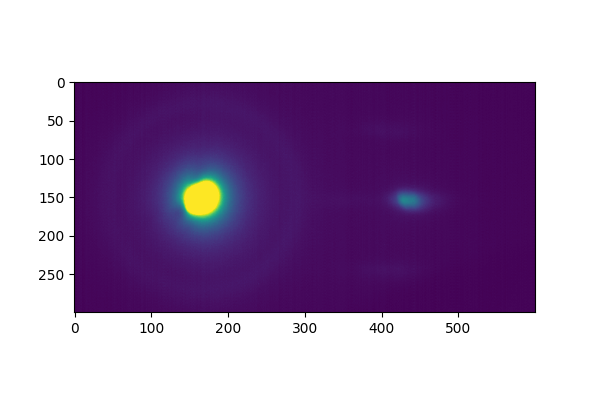

In [7]:
%matplotlib notebook
with h5py.File(RHEED_spot_file, mode='r') as h5:
    img = np.array(h5['growth_2'][0])
plt.imshow(img)
plt.show()

<HDF5 dataset "growth_2": shape (10612, 300, 600), type "<u2">


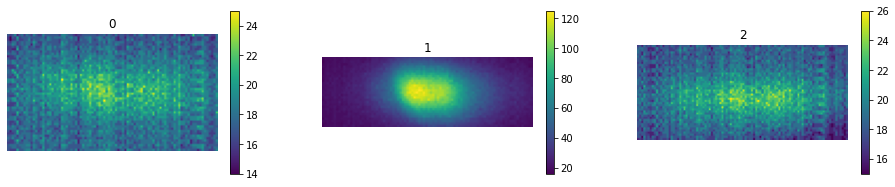

In [13]:
%matplotlib inline
frame = 10
g = 'growth_2'
spot_p = np.array([[40, 90, 360, 450], [140, 170, 390, 480], [220, 265, 355, 455]])

imgs = []
with h5py.File(RHEED_spot_file, mode='r') as h5:
    print(h5[g])
    for i in range(len(spot_p)):
        imgs.append(np.array(h5[g][frame, spot_p[i,0]:spot_p[i,1], spot_p[i,2]:spot_p[i,3]]))
show_images(imgs, colorbar=True, img_per_row=3)

### 2.2.3 Generate the metrics of spot

background_with_heater
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(2651, 50, 90) (2651, 30, 90) (2651, 45, 100)
---------------spot 0 ----------------


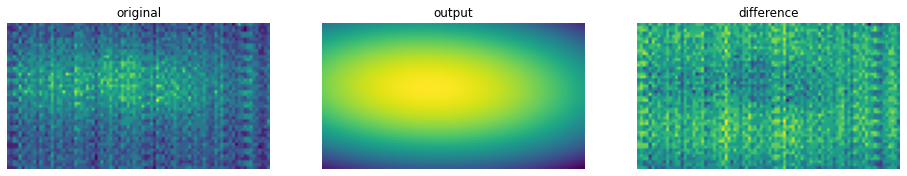

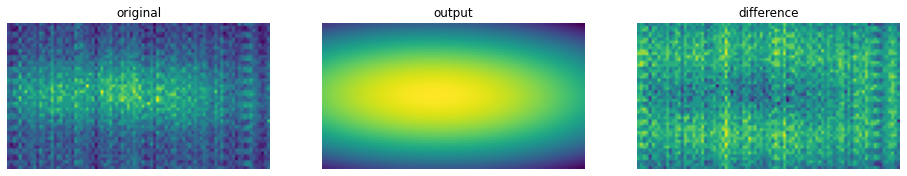

---------------spot 1 ----------------


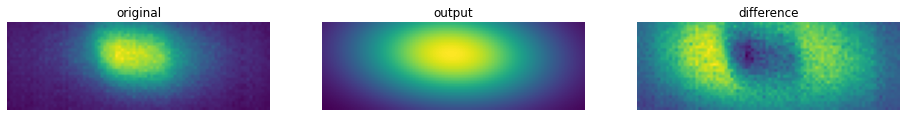

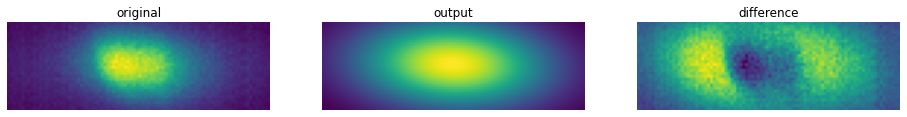

---------------spot 2 ----------------


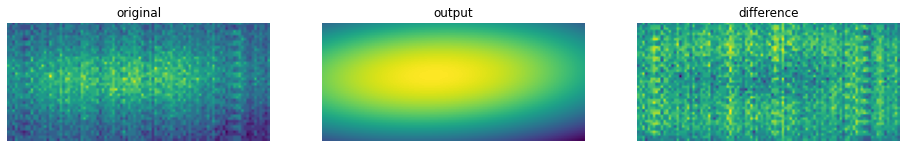

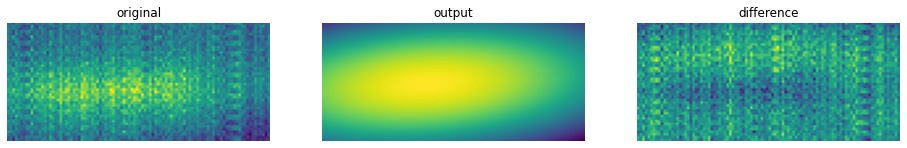

background_without_heater
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(2652, 50, 90) (2652, 30, 90) (2652, 45, 100)
---------------spot 0 ----------------


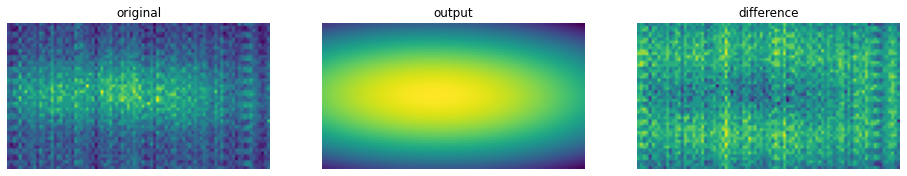

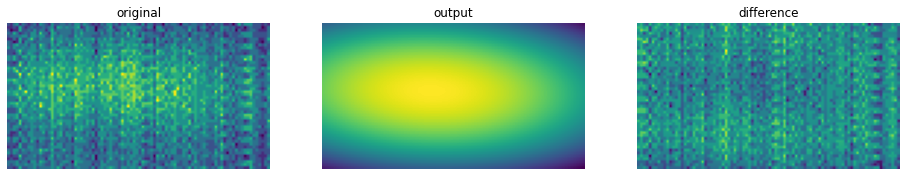

---------------spot 1 ----------------


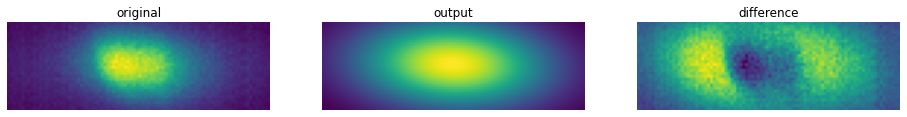

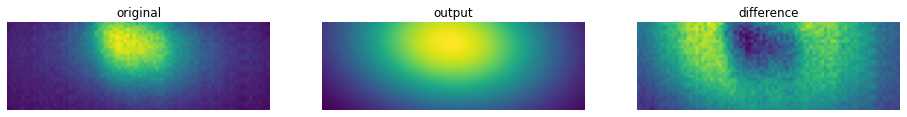

---------------spot 2 ----------------


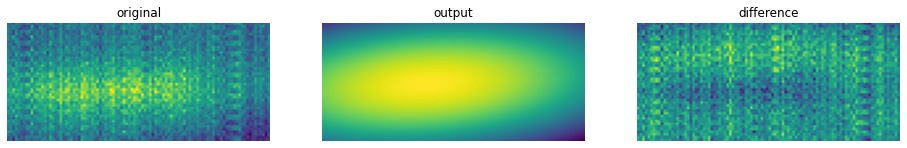

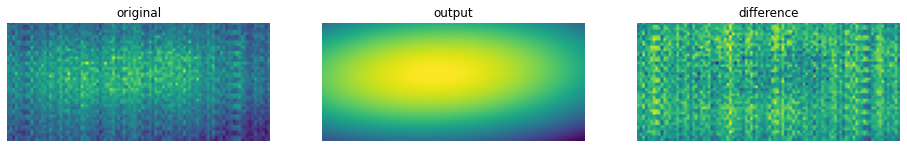

growth_1.
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(8603, 50, 90) (8603, 30, 90) (8603, 45, 100)
---------------spot 0 ----------------


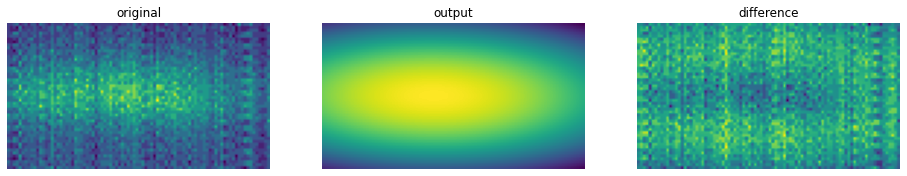

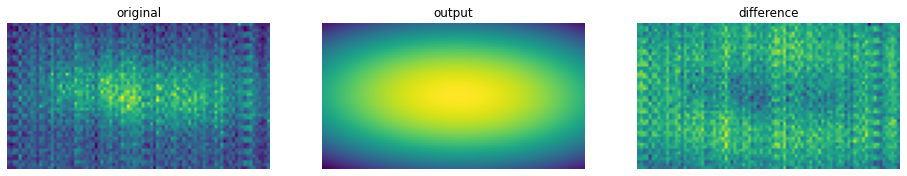

---------------spot 1 ----------------


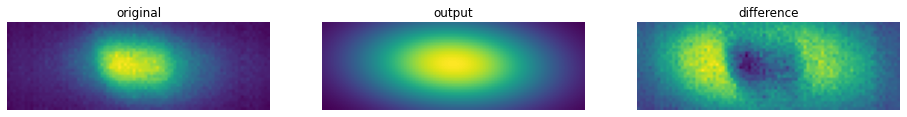

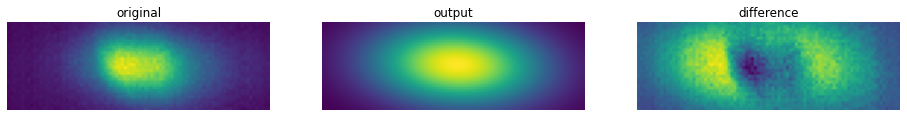

---------------spot 2 ----------------


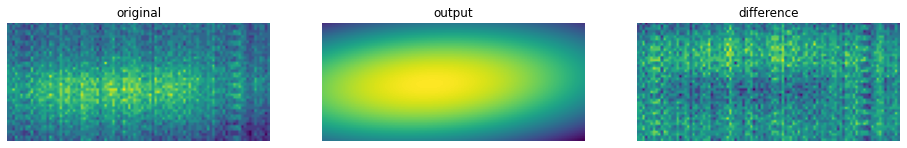

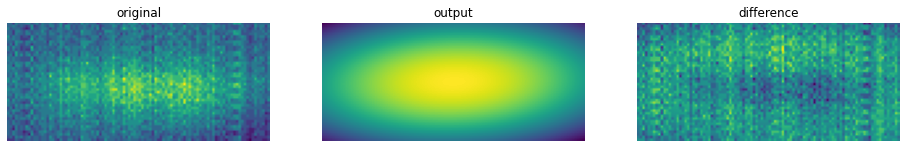

growth_2
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(10612, 50, 90) (10612, 30, 90) (10612, 45, 100)
---------------spot 0 ----------------


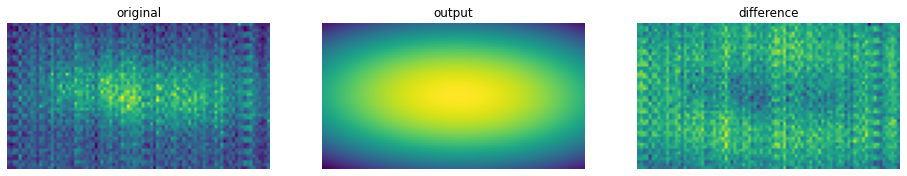

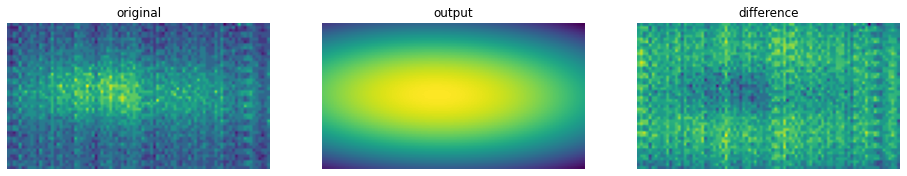

---------------spot 1 ----------------


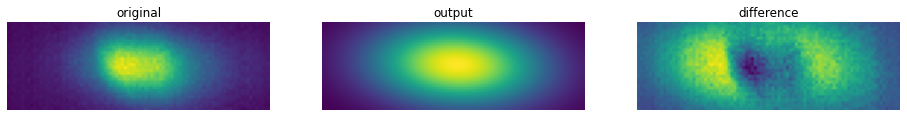

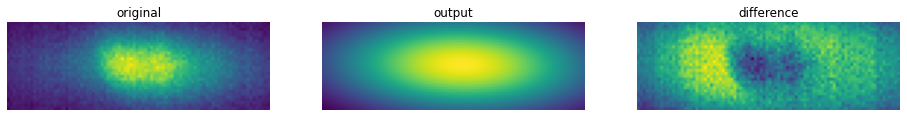

---------------spot 2 ----------------


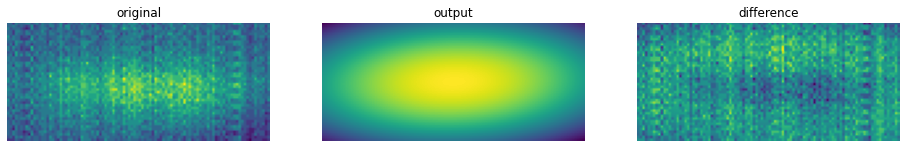

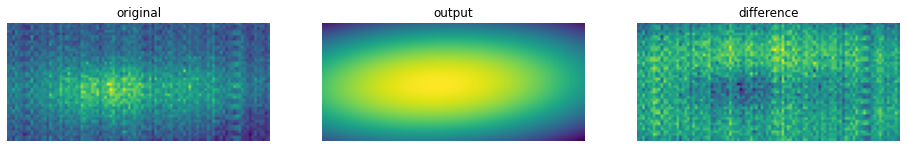

growth_3
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(11648, 50, 90) (11648, 30, 90) (11648, 45, 100)
---------------spot 0 ----------------


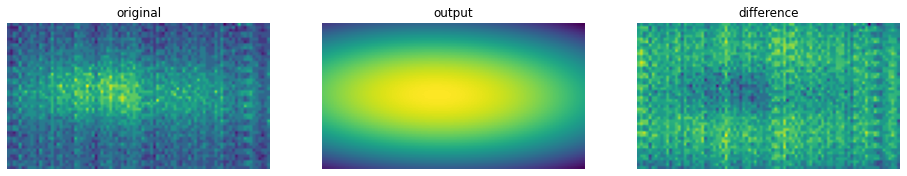

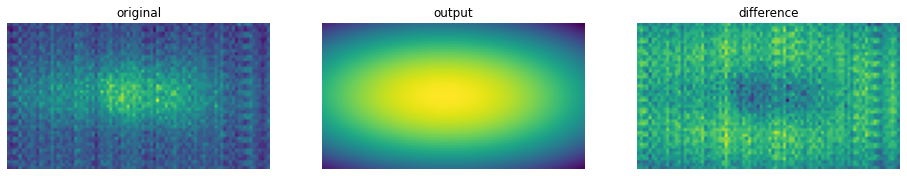

---------------spot 1 ----------------


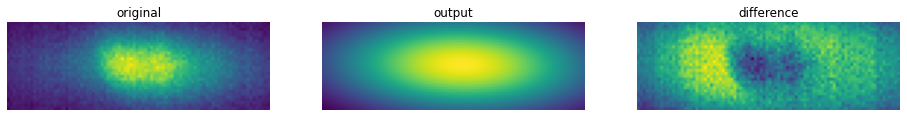

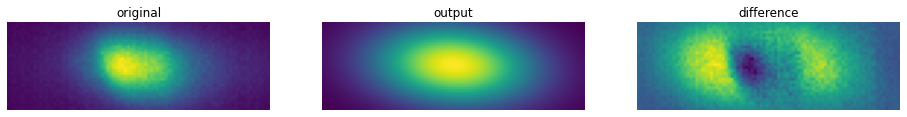

---------------spot 2 ----------------


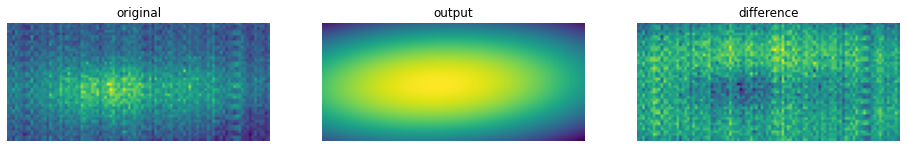

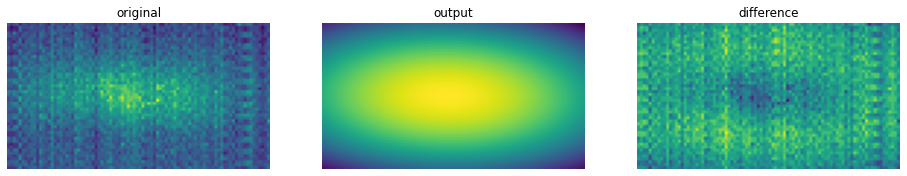

---------------spot 1 ----------------


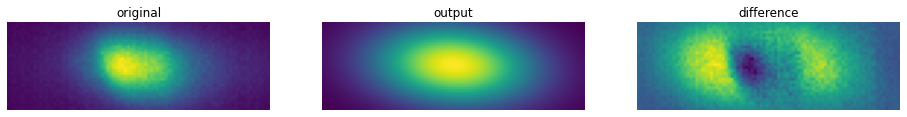

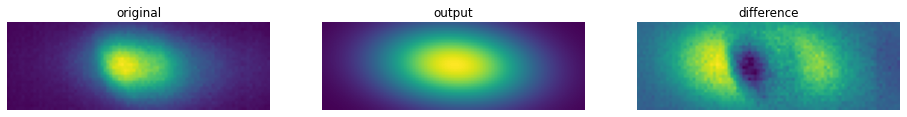

---------------spot 2 ----------------


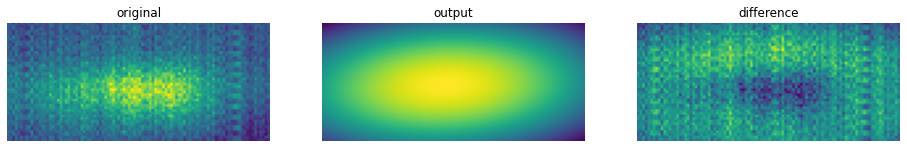

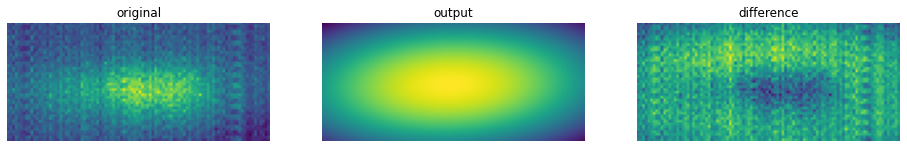

growth_5
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12317, 50, 90) (12317, 30, 90) (12317, 45, 100)
---------------spot 0 ----------------


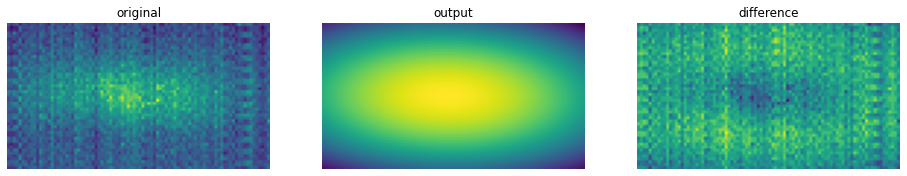

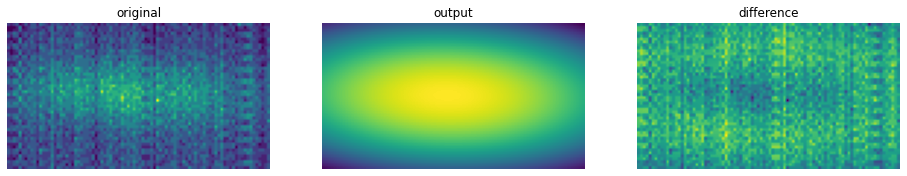

---------------spot 1 ----------------


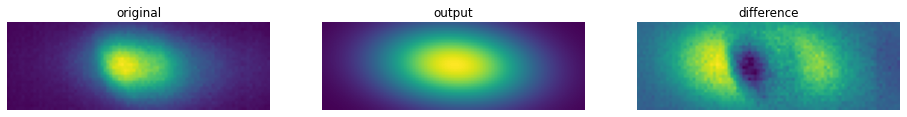

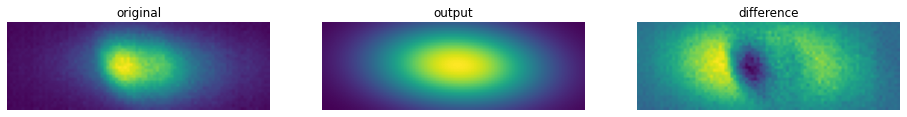

---------------spot 2 ----------------


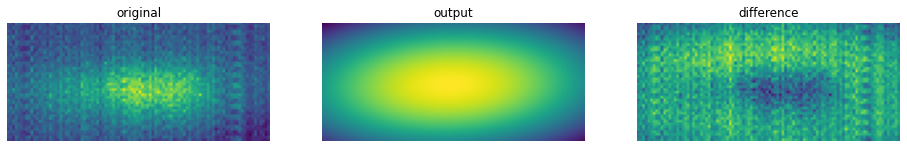

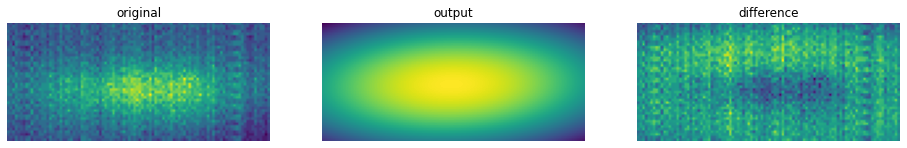

growth_6
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12453, 50, 90) (12453, 30, 90) (12453, 45, 100)
---------------spot 0 ----------------


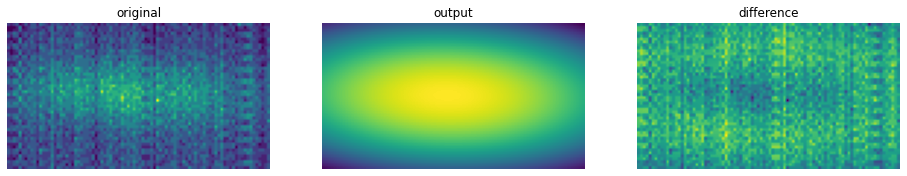

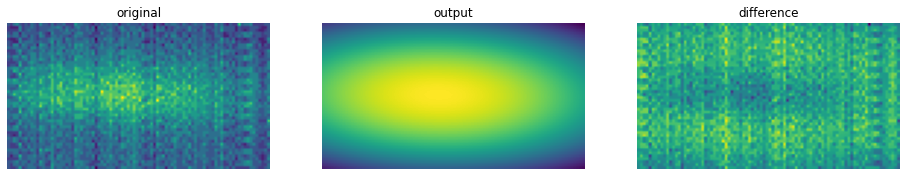

---------------spot 1 ----------------


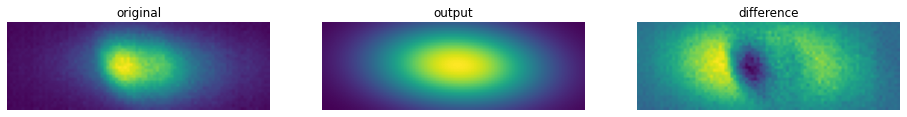

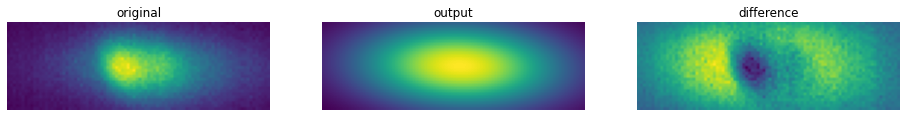

---------------spot 2 ----------------


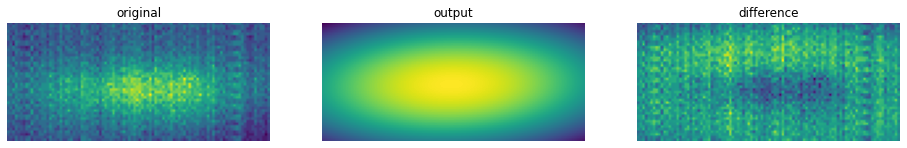

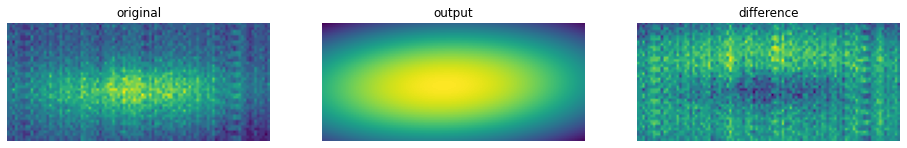

growth_7
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(9482, 50, 90) (9482, 30, 90) (9482, 45, 100)
---------------spot 0 ----------------


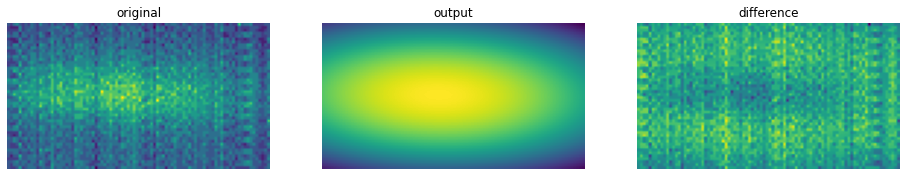

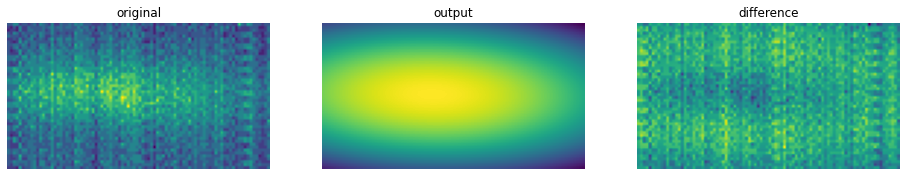

---------------spot 1 ----------------


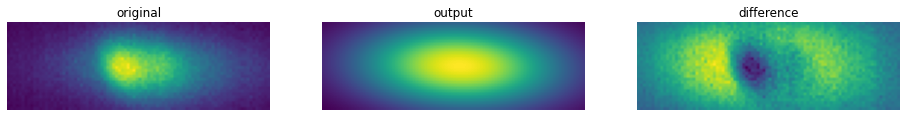

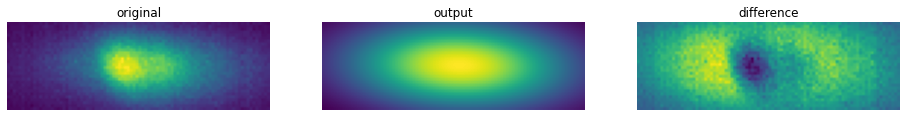

---------------spot 2 ----------------


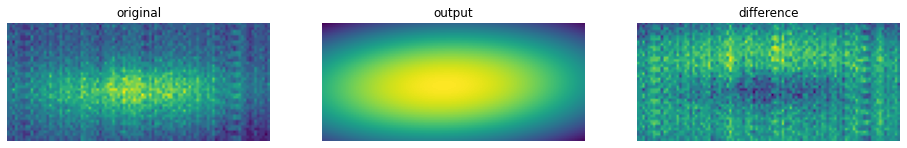

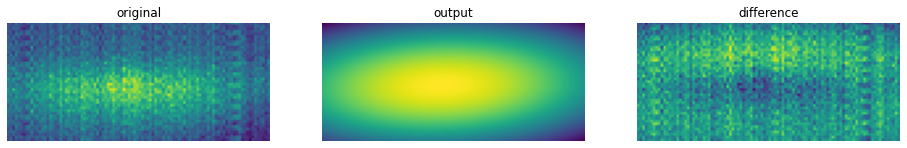

growth_8
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(9490, 50, 90) (9490, 30, 90) (9490, 45, 100)
---------------spot 0 ----------------


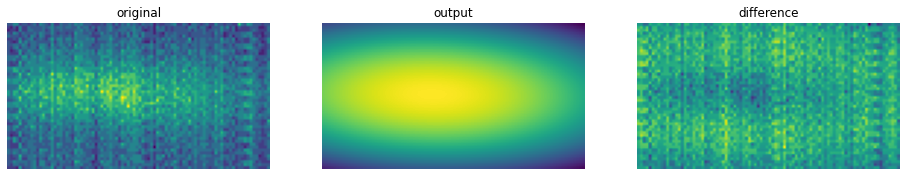

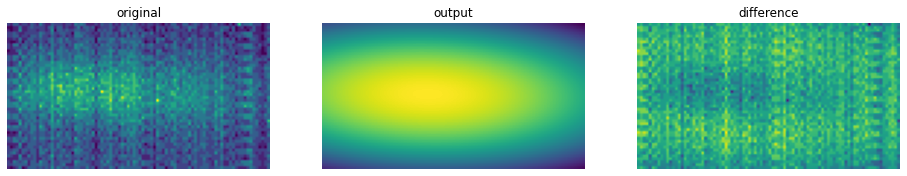

---------------spot 1 ----------------


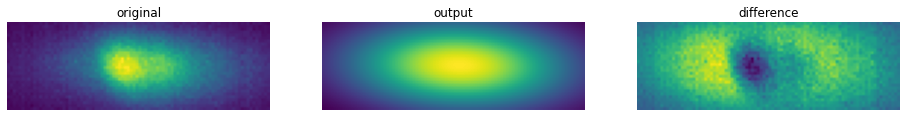

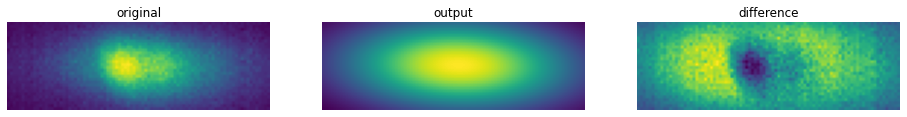

---------------spot 2 ----------------


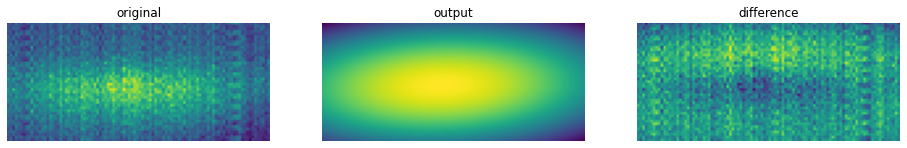

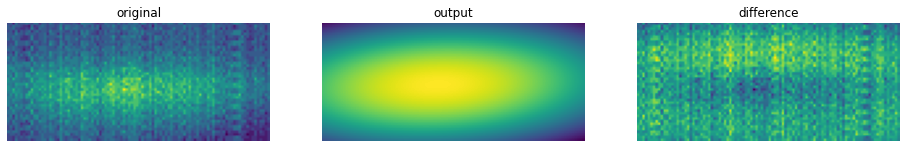

growth_9
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(9704, 50, 90) (9704, 30, 90) (9704, 45, 100)
---------------spot 0 ----------------


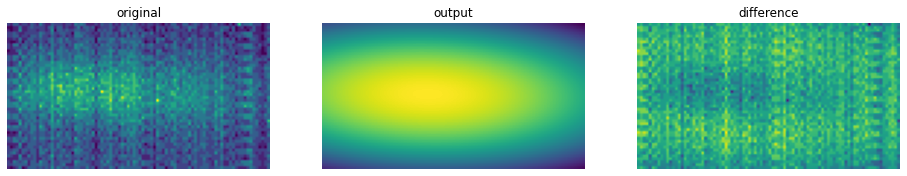

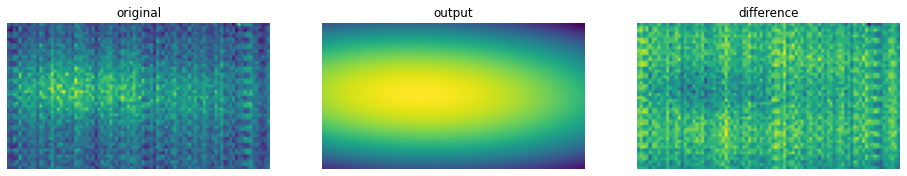

---------------spot 1 ----------------


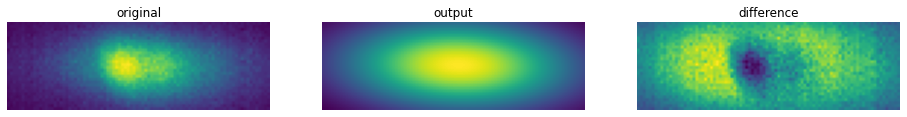

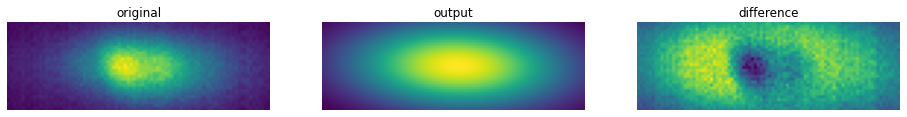

---------------spot 2 ----------------


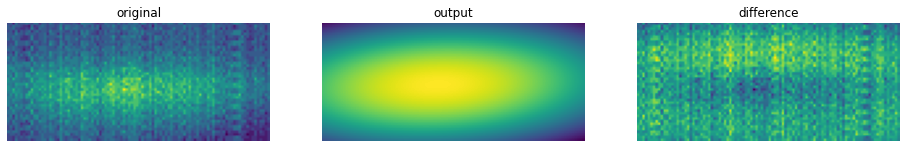

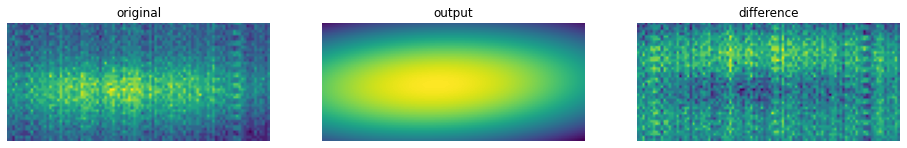

growth_10
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(9439, 50, 90) (9439, 30, 90) (9439, 45, 100)
---------------spot 0 ----------------


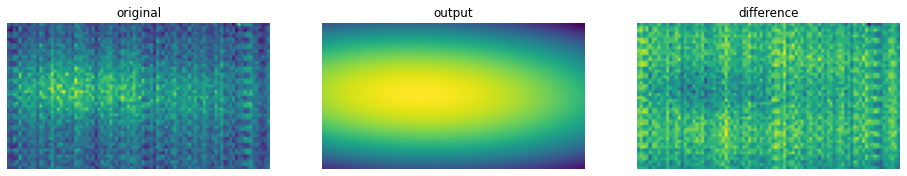

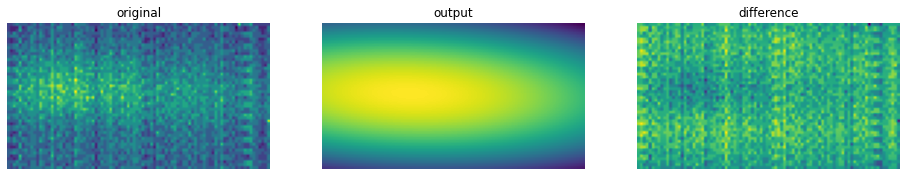

---------------spot 1 ----------------


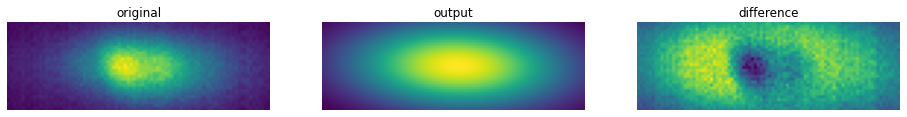

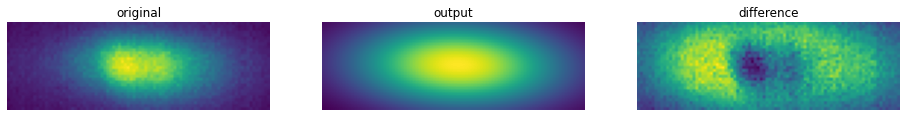

---------------spot 2 ----------------


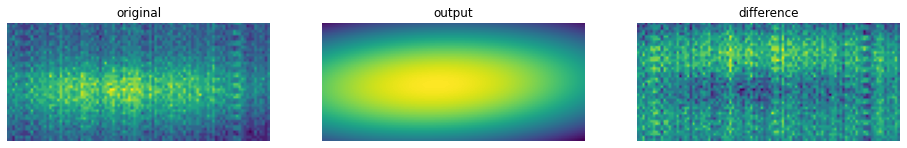

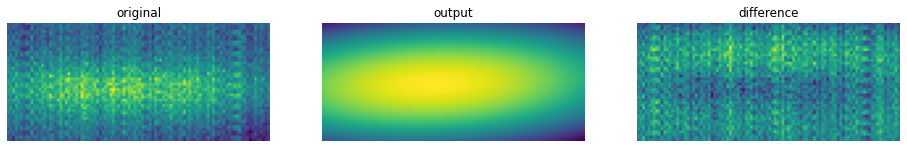

growth_11
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(12155, 50, 90) (12155, 30, 90) (12155, 45, 100)
---------------spot 0 ----------------


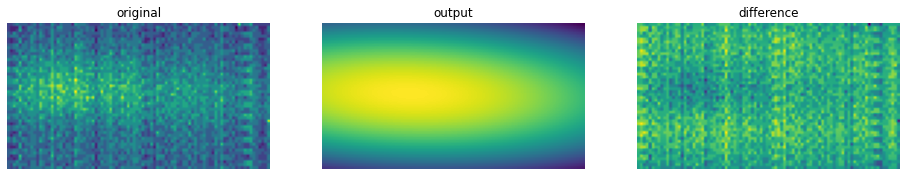

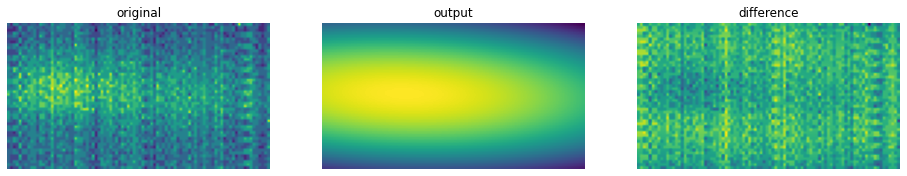

---------------spot 1 ----------------


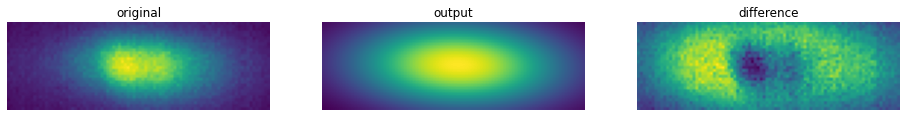

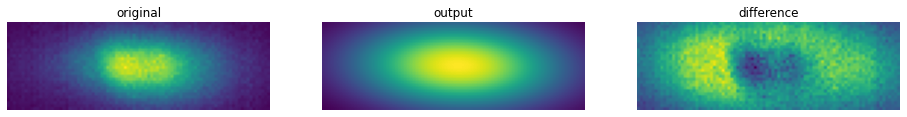

---------------spot 2 ----------------


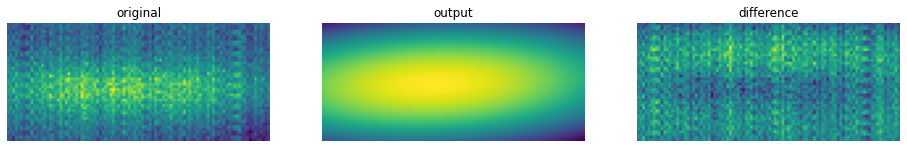

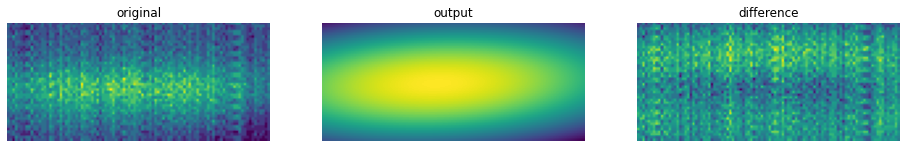

growth_12
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_10', 'growth_11', 'growth_12', 'growth_2', 'growth_3', 'growth_4', 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9']>
(10736, 50, 90) (10736, 30, 90) (10736, 45, 100)
---------------spot 0 ----------------


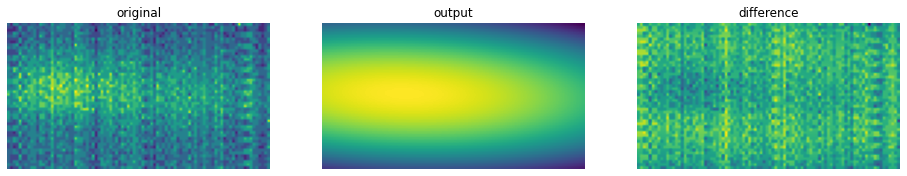

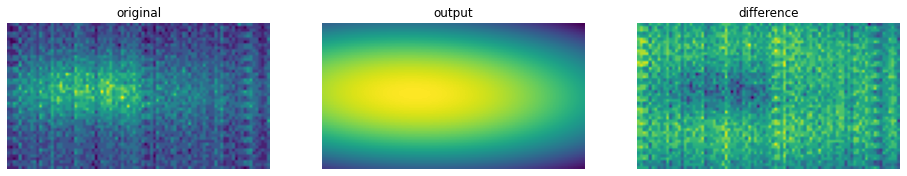

---------------spot 1 ----------------


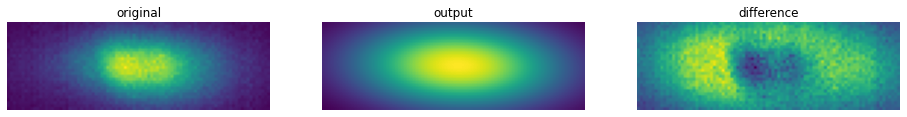

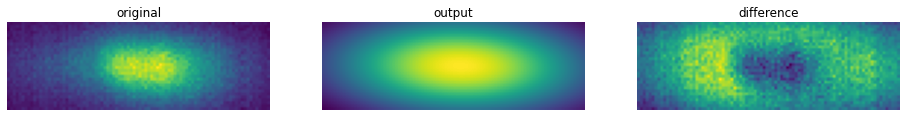

---------------spot 2 ----------------


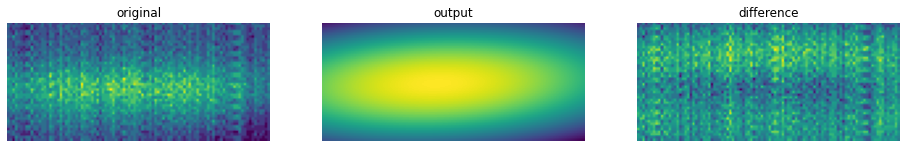

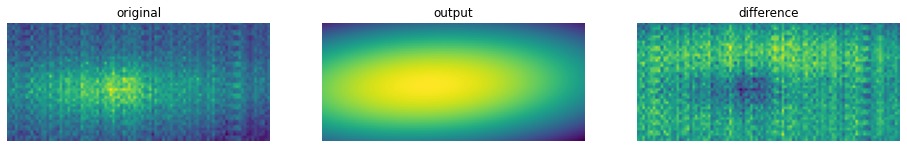

In [14]:
Parameters_file = '../data/test7_gaussian_fit_parameters_all.h5'
growth_titles = ['background_with_heater', 'background_without_heater', 'growth_1.', 'growth_2', 'growth_3', 'growth_4', 
                 'growth_5', 'growth_6', 'growth_7', 'growth_8', 'growth_9', 'growth_10', 'growth_11', 'growth_12']
generate_parameter_file(RHEED_spot_file, Parameters_file, growth_titles, spot_p, show=True)

### 2.2.4 Upload parameter file to DataFed

In [3]:
import json # For dealing with metadata
import os # For file level operations
from datafed.CommandLib import API
df_api = API()

name = 'test7_gaussian_fit_parameters_all'

dc_resp = df_api.dataCreate(
                name,
                parent_id='c/393370045'  
                           )
rec_id = dc_resp[0].data[0].id
put_resp = df_api.dataPut(rec_id, # record id
                          './'+name+'.h5', # path to file
                          wait=True,  # Waitcas until transfer completes.
                          )
put_resp

(task {
   id: "task/402961845"
   type: TT_DATA_PUT
   status: TS_SUCCEEDED
   client: "u/yig319"
   step: 3
   steps: 4
   msg: "Finished"
   ct: 1657842467
   ut: 1657842586
   source: "lehigh#nhi-gpu/scratch/yichen/notebooks/RHEED/test6_gaussian_fit_parameters_all.h5"
   dest: "d/402961839"
 },
 'TaskDataReply')

## 2.3 Sample 2 - untreated substrate (0.28±0.03 μm)

### 2.3.1 Information about dataset

In [9]:
RHEED_spot_file = '/scratch/yichen/RHEED_data/STO_STO_test9_07142022.h5'    
with h5py.File(RHEED_spot_file, mode='r') as h5:
    print('Key parameters:', list(h5.keys()))
    print('Size of data:', h5['growth_02'].shape)

Key parameters: ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']
Size of data: (9321, 300, 300)


### 2.3.2 Locate the spots

<IPython.core.display.Javascript object>


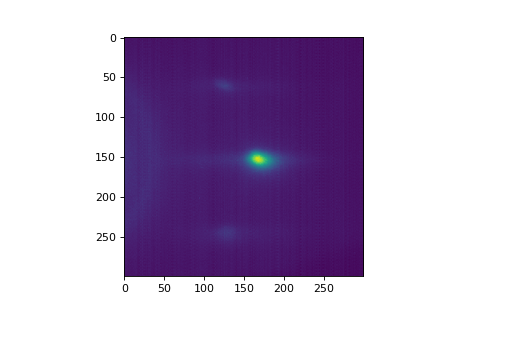

In [19]:
%matplotlib notebook
with h5py.File(RHEED_spot_file, mode='r') as h5:
    img = np.array(h5['growth_02'][0])
plt.imshow(img)
plt.show()

<HDF5 dataset "growth_02": shape (9321, 300, 300), type "<u2">


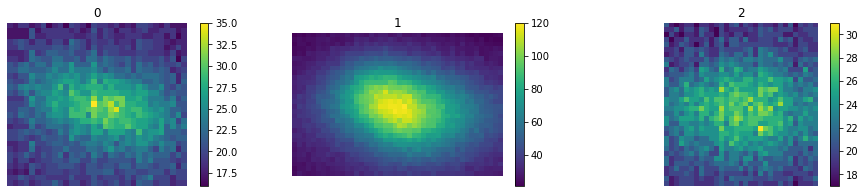

In [10]:
%matplotlib inline
frame = 10
g = 'growth_02'
spot_p = np.array([[48, 77, 110, 142], [140, 170, 148, 192], [230, 263, 114, 145]])

imgs = []
with h5py.File(RHEED_spot_file, mode='r') as h5:
    print(h5[g])
    for i in range(len(spot_p)):
        imgs.append(np.array(h5[g][frame, spot_p[i,0]:spot_p[i,1], spot_p[i,2]:spot_p[i,3]]))
show_images(imgs, colorbar=True, img_per_row=3)

### 2.3.3 Generate the metrics of spot

background_with_heater
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(2023, 29, 32) (2023, 30, 44) (2023, 33, 31)
---------------spot 0 ----------------


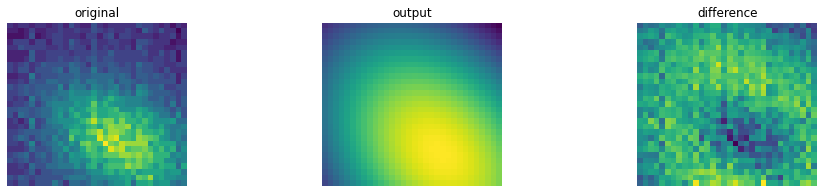

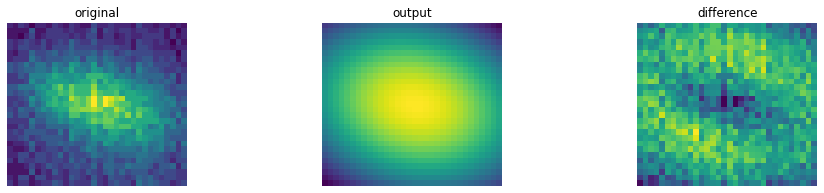

---------------spot 1 ----------------


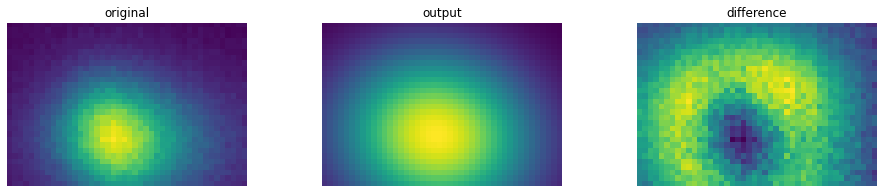

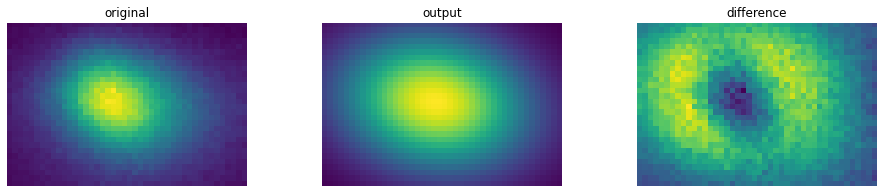

---------------spot 2 ----------------


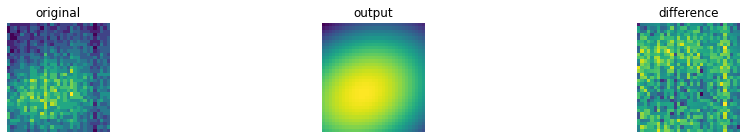

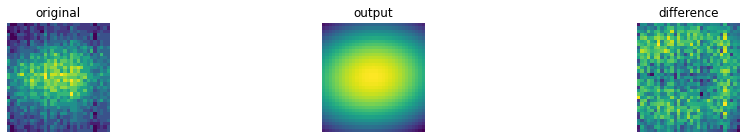

background_without_heater
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(3060, 29, 32) (3060, 30, 44) (3060, 33, 31)
---------------spot 0 ----------------


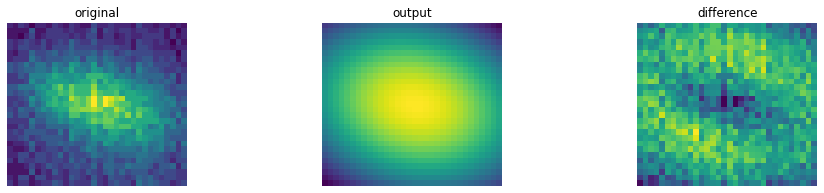

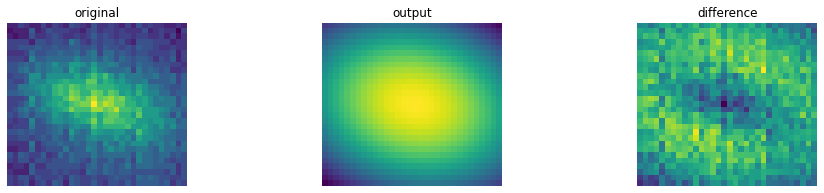

---------------spot 1 ----------------


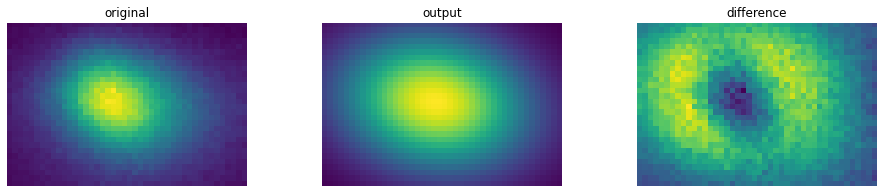

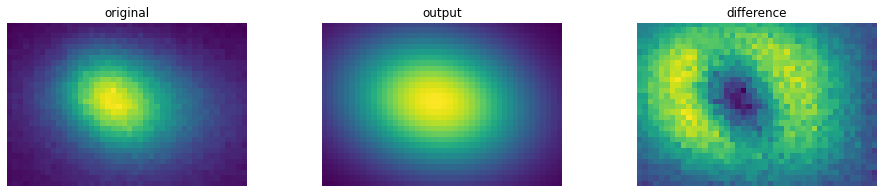

---------------spot 2 ----------------


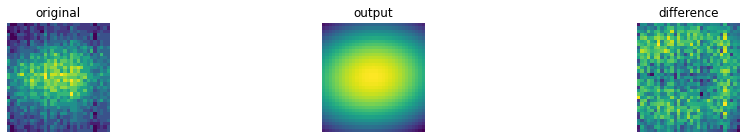

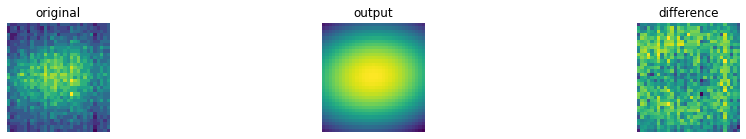

growth_01
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(13510, 29, 32) (13510, 30, 44) (13510, 33, 31)
---------------spot 0 ----------------


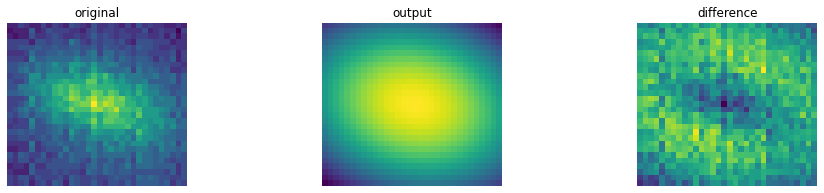

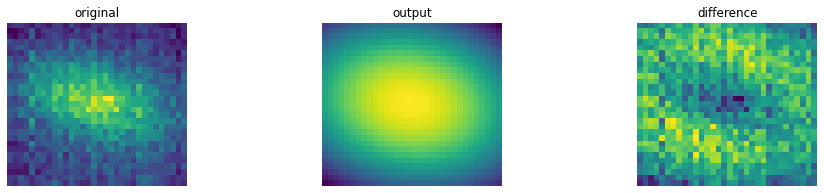

---------------spot 1 ----------------


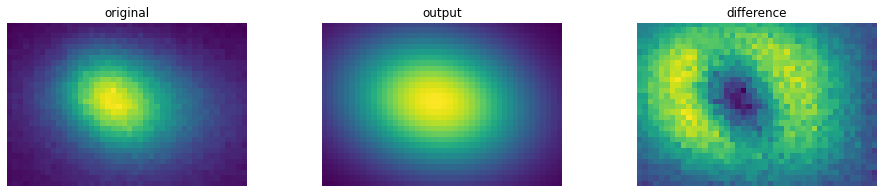

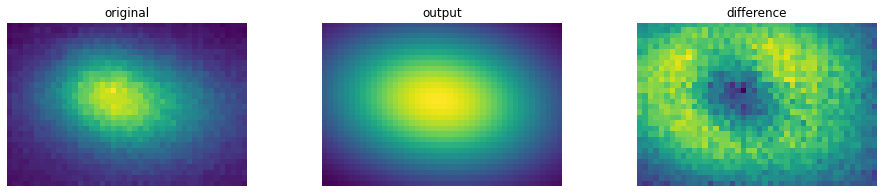

---------------spot 2 ----------------


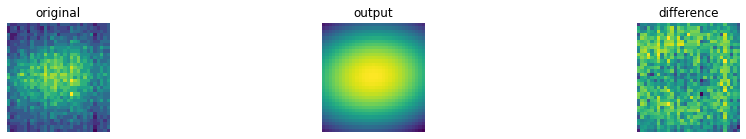

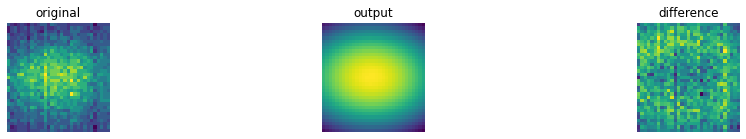

growth_02
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(9321, 29, 32) (9321, 30, 44) (9321, 33, 31)
---------------spot 0 ----------------


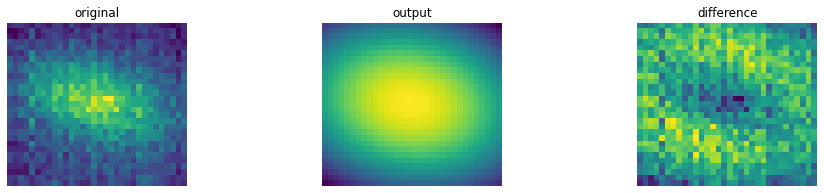

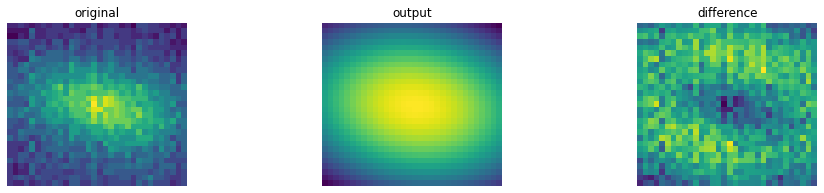

---------------spot 1 ----------------


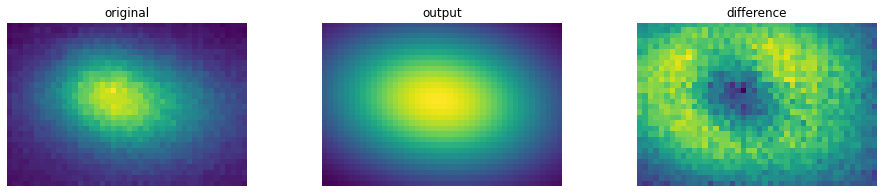

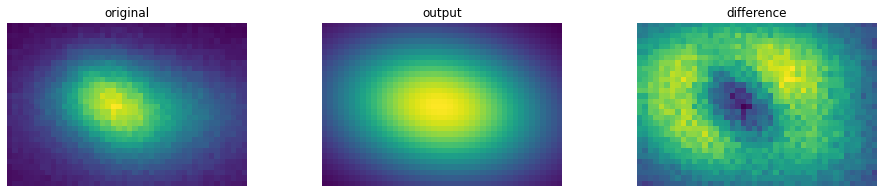

---------------spot 2 ----------------


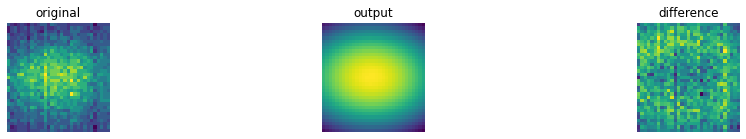

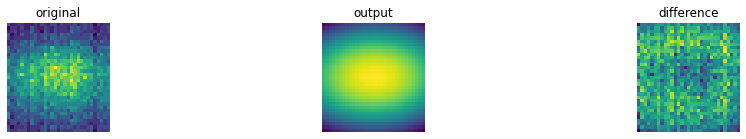

growth_04
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(13125, 29, 32) (13125, 30, 44) (13125, 33, 31)
---------------spot 0 ----------------


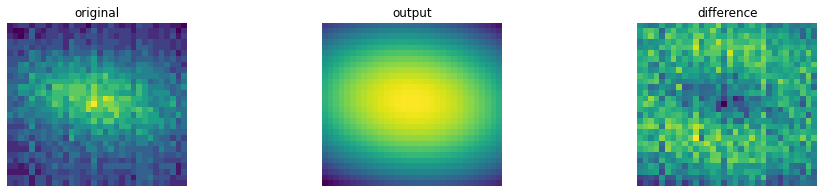

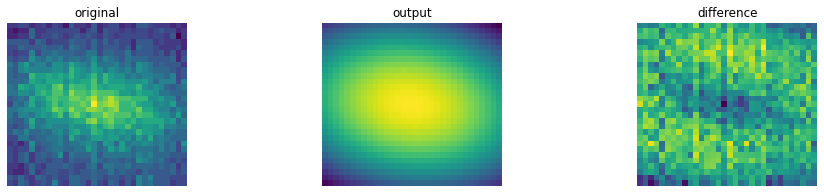

---------------spot 1 ----------------


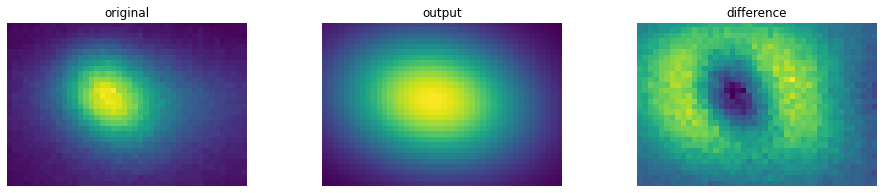

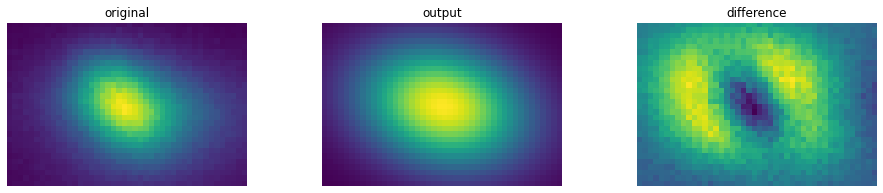

---------------spot 2 ----------------


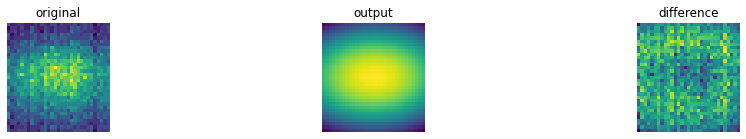

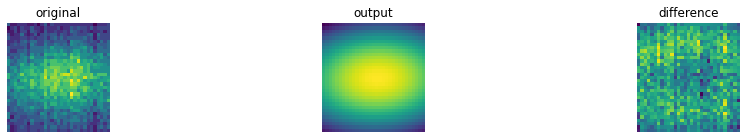

growth_05
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12982, 29, 32) (12982, 30, 44) (12982, 33, 31)
---------------spot 0 ----------------


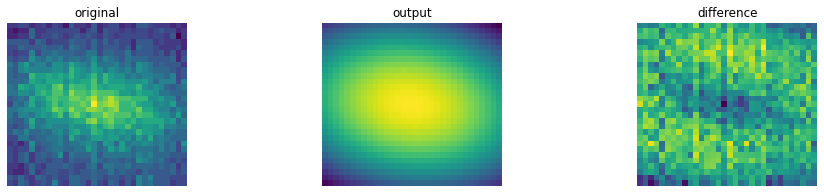

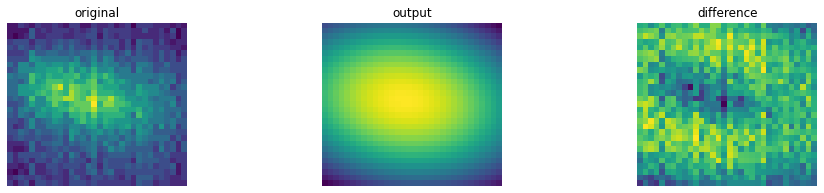

---------------spot 1 ----------------


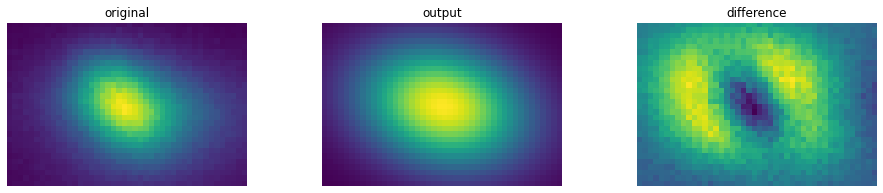

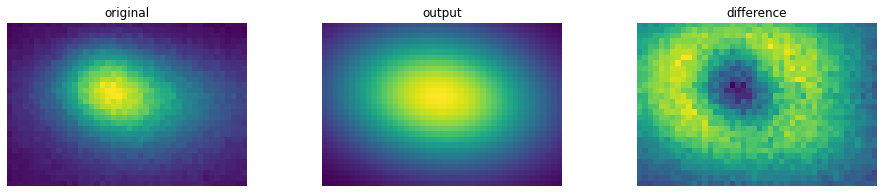

---------------spot 2 ----------------


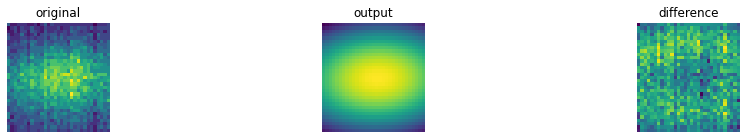

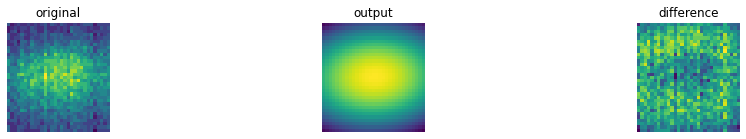

growth_06
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12776, 29, 32) (12776, 30, 44) (12776, 33, 31)
---------------spot 0 ----------------


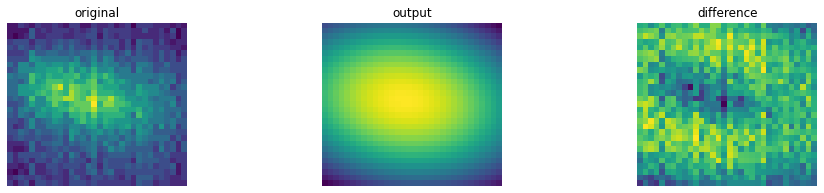

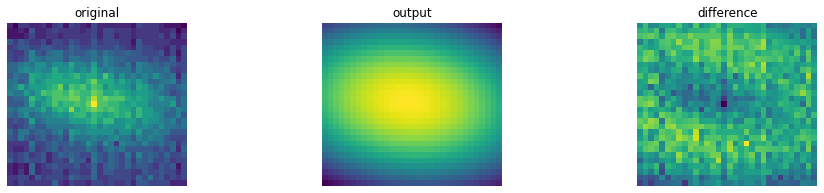

---------------spot 1 ----------------


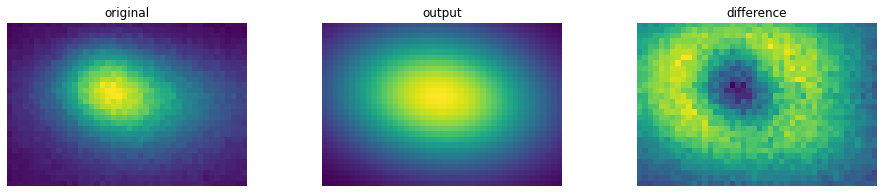

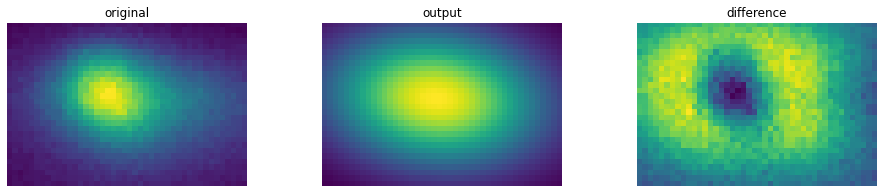

---------------spot 2 ----------------


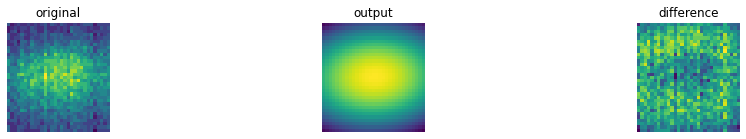

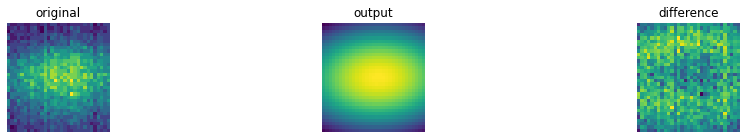

growth_07
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12670, 29, 32) (12670, 30, 44) (12670, 33, 31)
---------------spot 0 ----------------


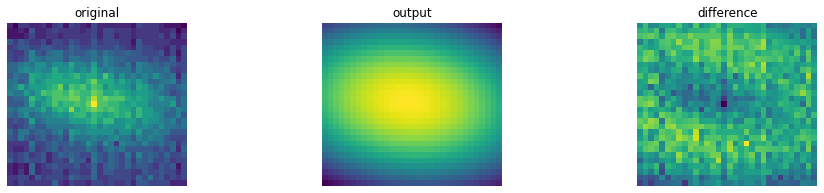

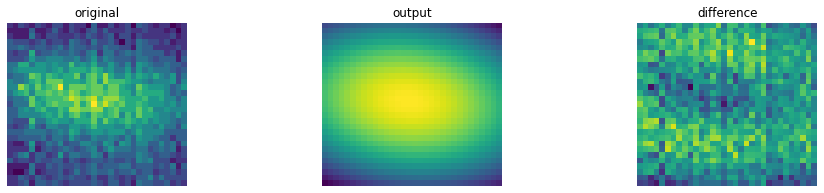

---------------spot 1 ----------------


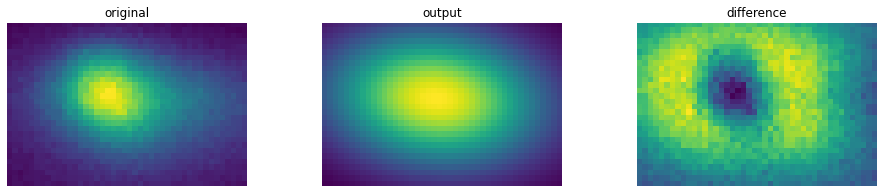

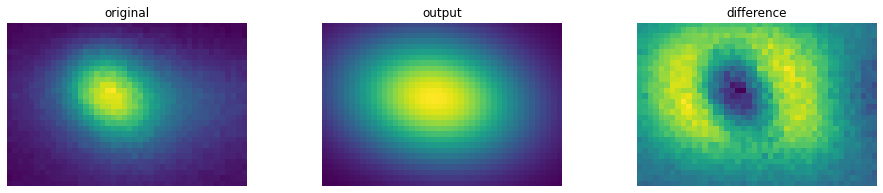

---------------spot 2 ----------------


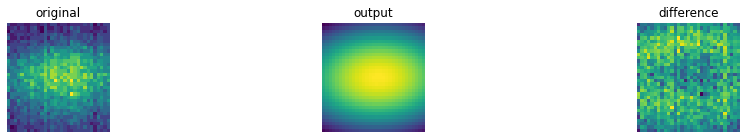

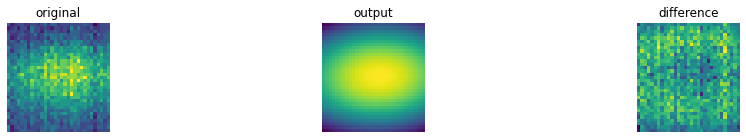

growth_08
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12441, 29, 32) (12441, 30, 44) (12441, 33, 31)
---------------spot 0 ----------------


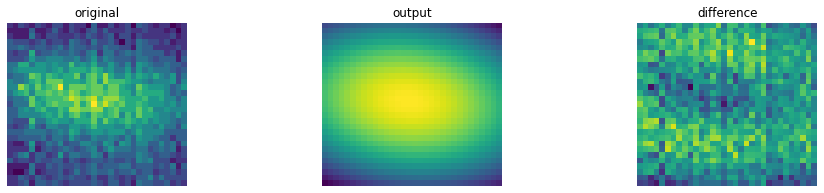

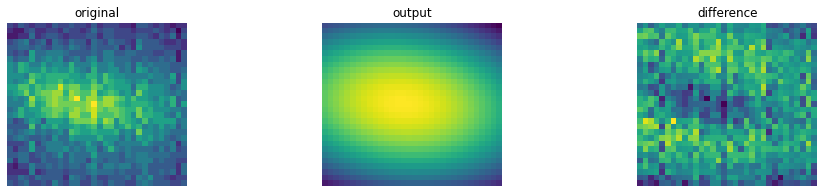

---------------spot 1 ----------------


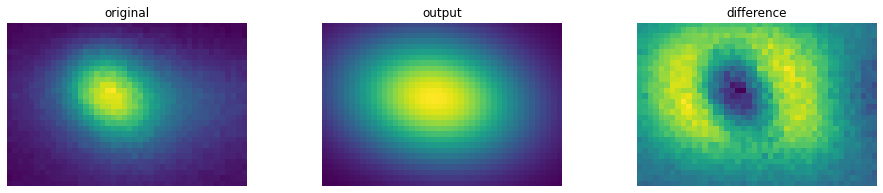

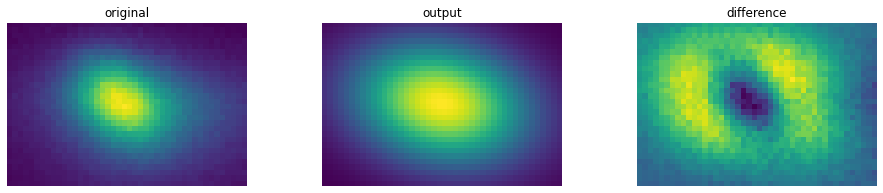

---------------spot 2 ----------------


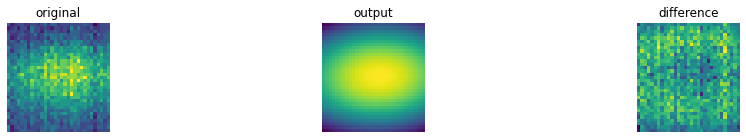

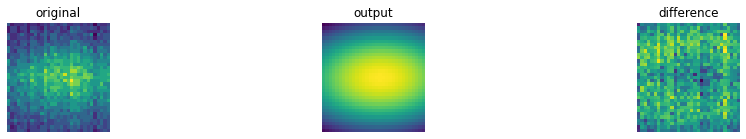

growth_09
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12222, 29, 32) (12222, 30, 44) (12222, 33, 31)
---------------spot 0 ----------------


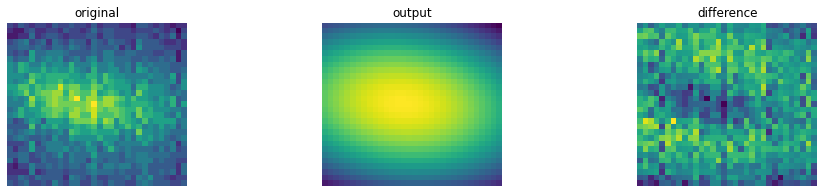

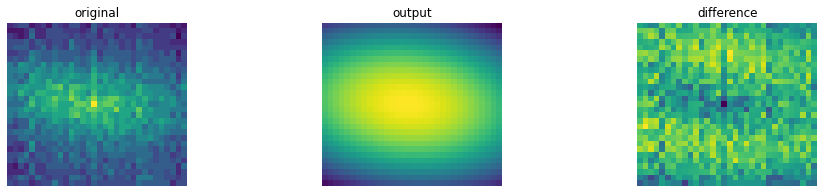

---------------spot 1 ----------------


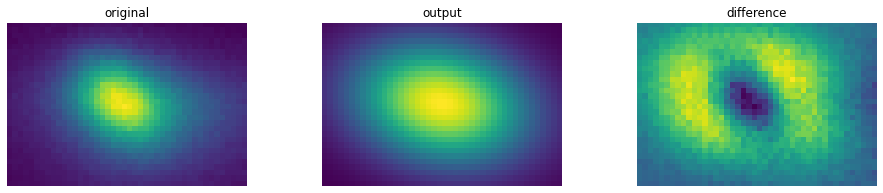

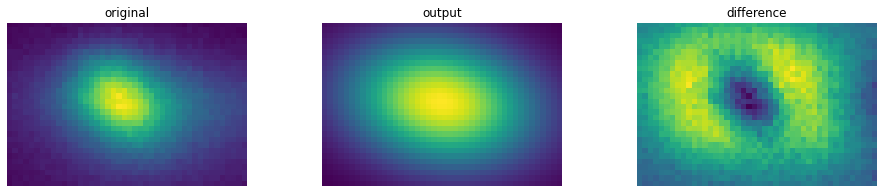

---------------spot 2 ----------------


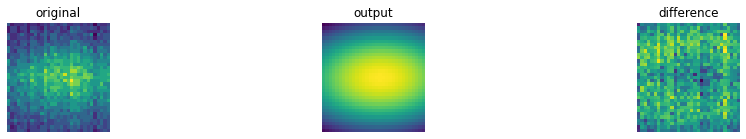

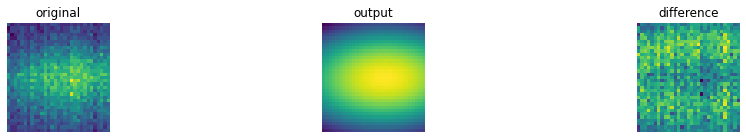

growth_10
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12488, 29, 32) (12488, 30, 44) (12488, 33, 31)
---------------spot 0 ----------------


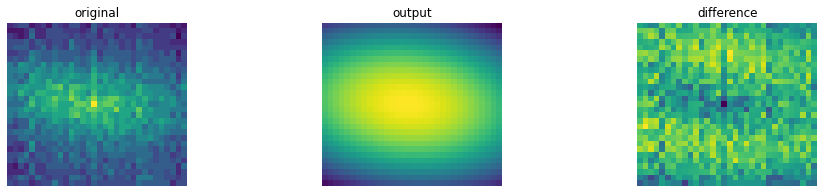

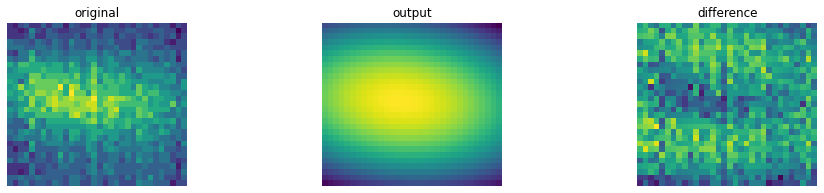

---------------spot 1 ----------------


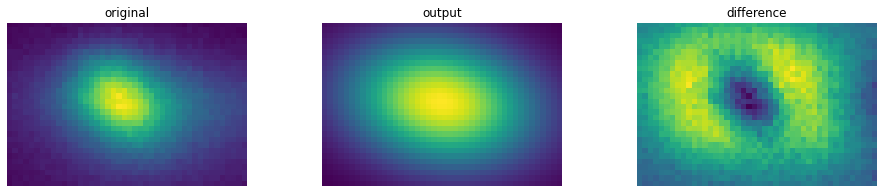

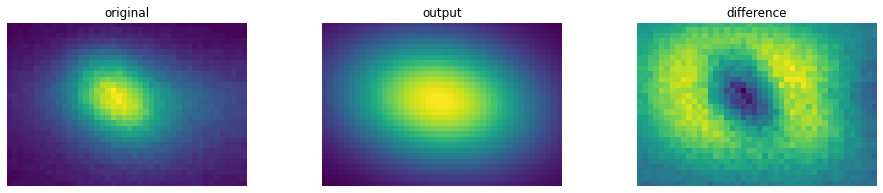

---------------spot 2 ----------------


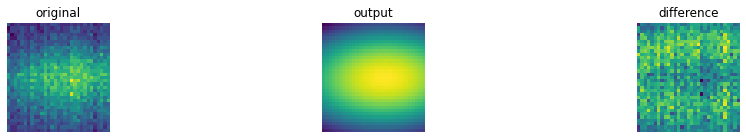

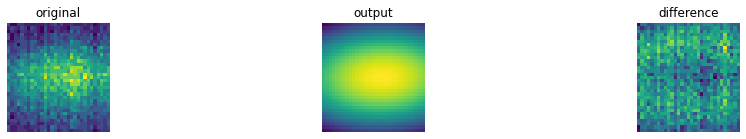

growth_11
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12221, 29, 32) (12221, 30, 44) (12221, 33, 31)
---------------spot 0 ----------------


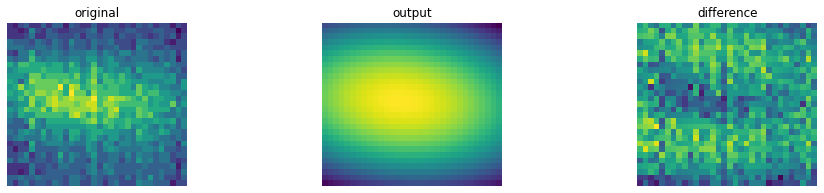

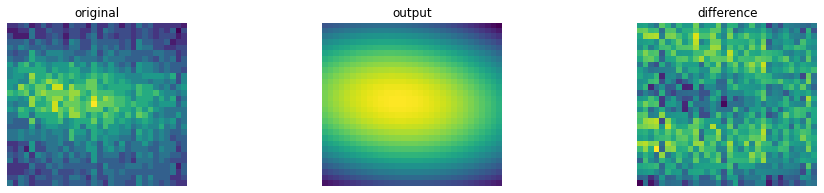

---------------spot 1 ----------------


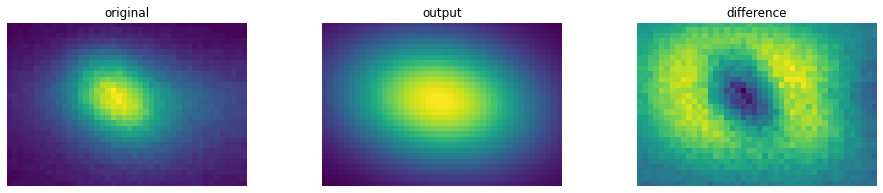

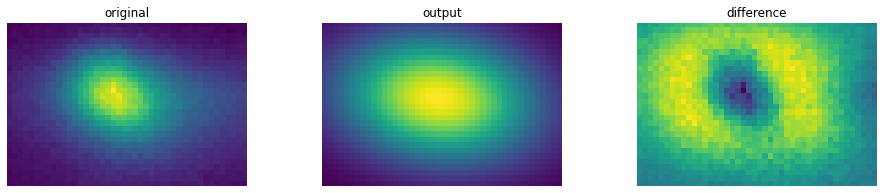

---------------spot 2 ----------------


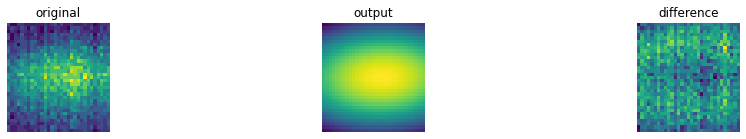

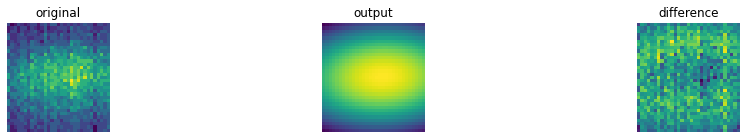

growth_12
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12526, 29, 32) (12526, 30, 44) (12526, 33, 31)
---------------spot 0 ----------------


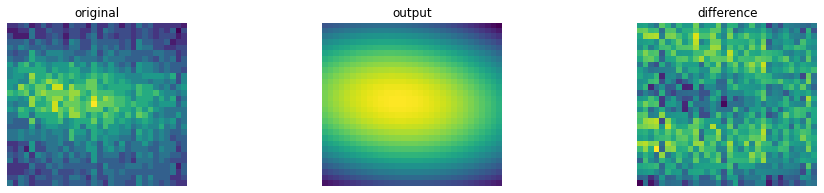

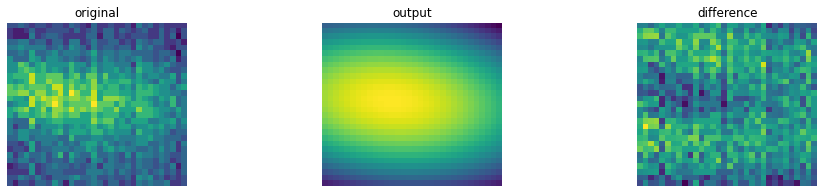

---------------spot 1 ----------------


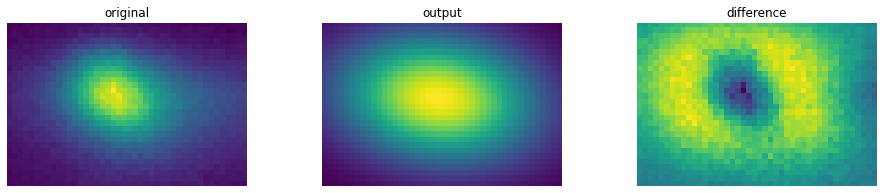

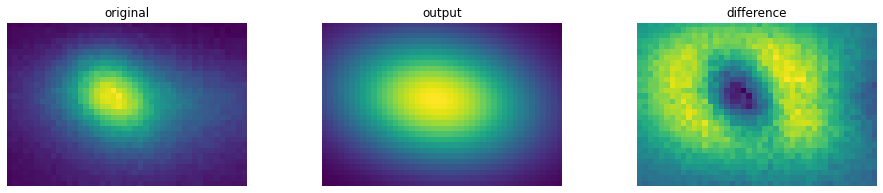

---------------spot 2 ----------------


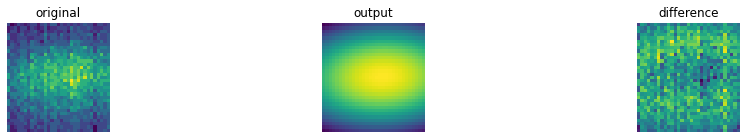

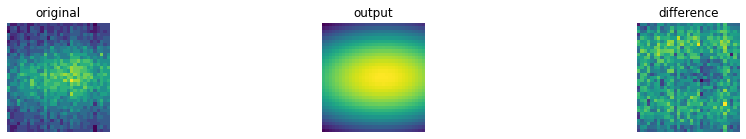

growth_13
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12318, 29, 32) (12318, 30, 44) (12318, 33, 31)
---------------spot 0 ----------------


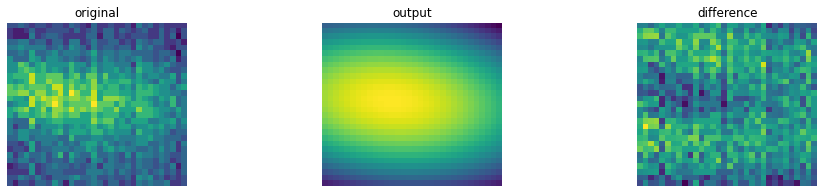

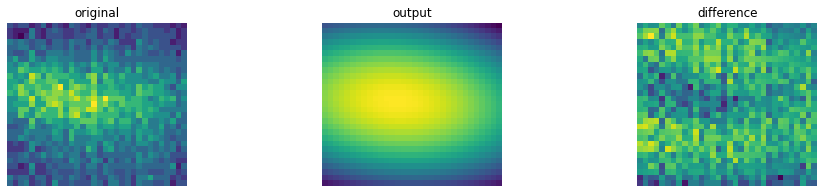

---------------spot 1 ----------------


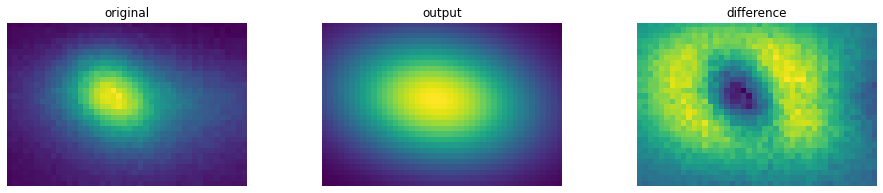

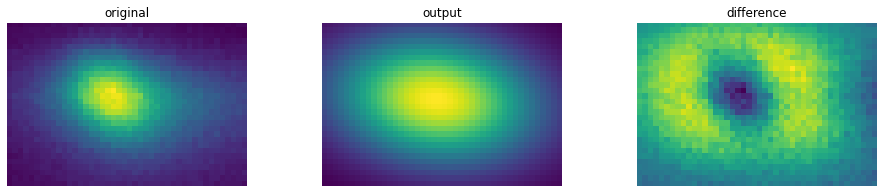

---------------spot 2 ----------------


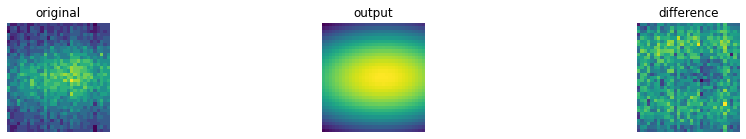

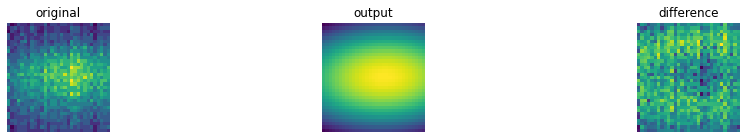

growth_14
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12206, 29, 32) (12206, 30, 44) (12206, 33, 31)
---------------spot 0 ----------------


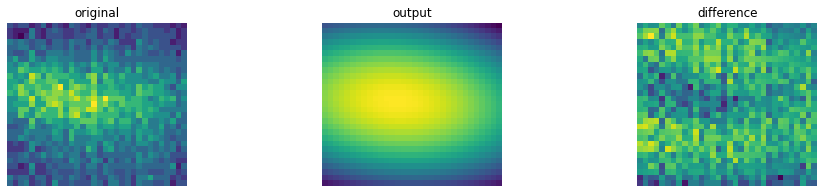

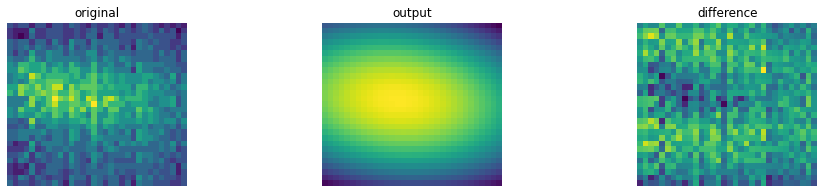

---------------spot 1 ----------------


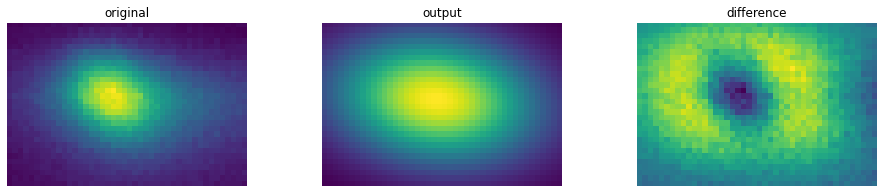

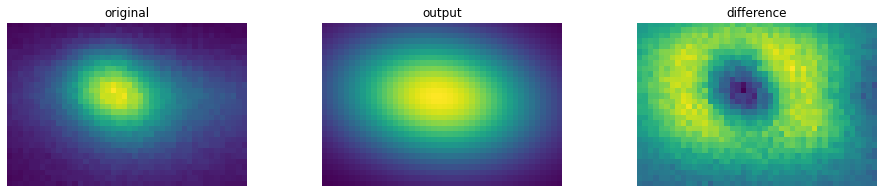

---------------spot 2 ----------------


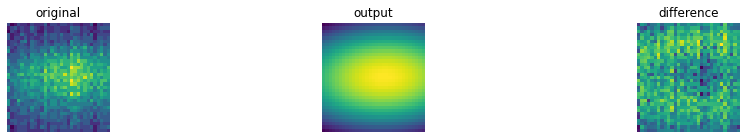

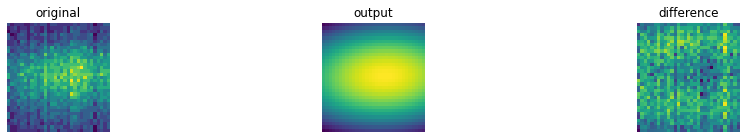

growth_15
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12269, 29, 32) (12269, 30, 44) (12269, 33, 31)
---------------spot 0 ----------------


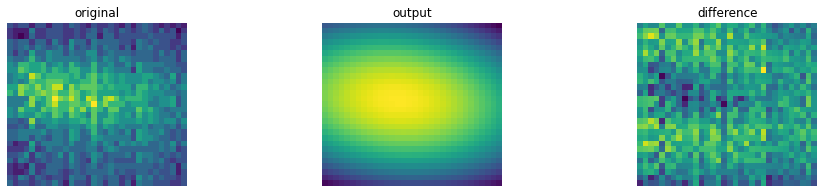

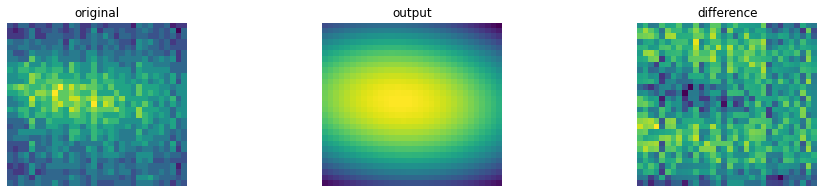

---------------spot 1 ----------------


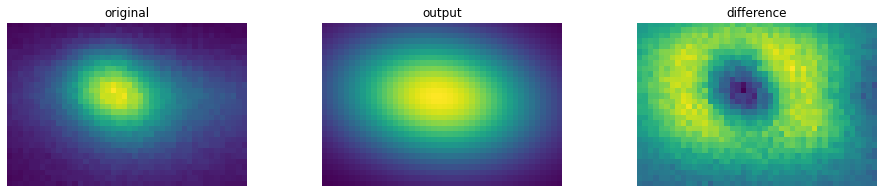

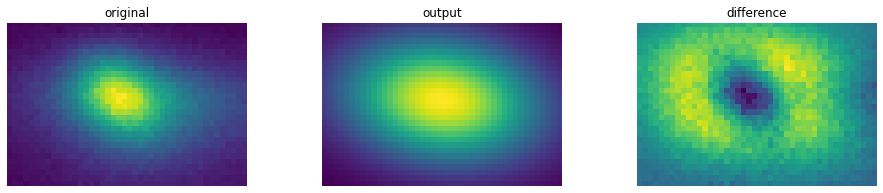

---------------spot 2 ----------------


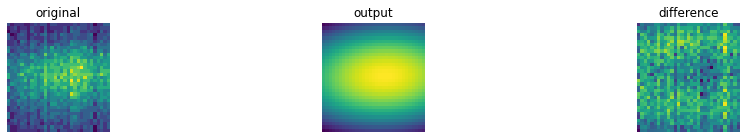

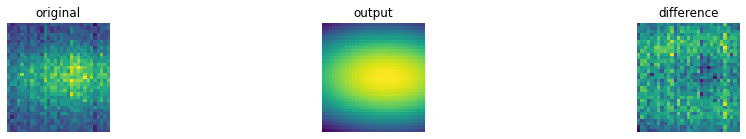

growth_16
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12133, 29, 32) (12133, 30, 44) (12133, 33, 31)
---------------spot 0 ----------------


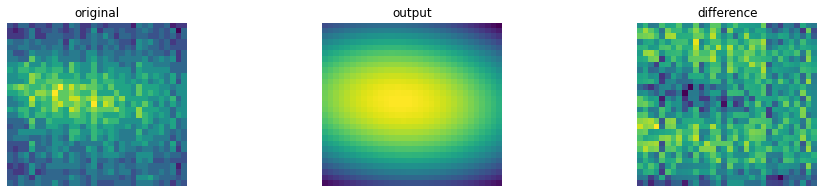

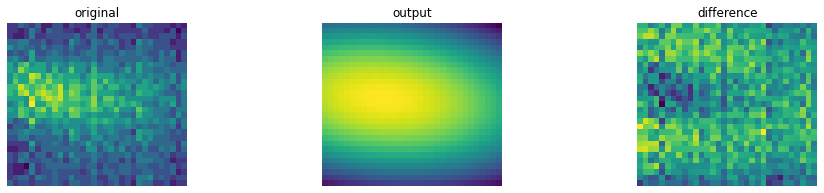

---------------spot 1 ----------------


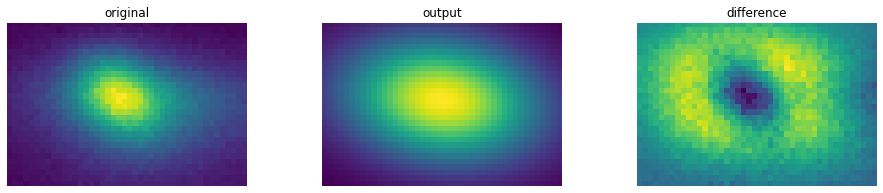

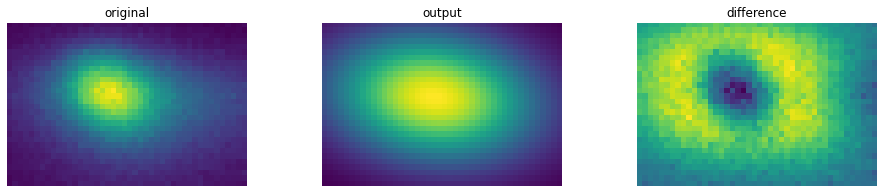

---------------spot 2 ----------------


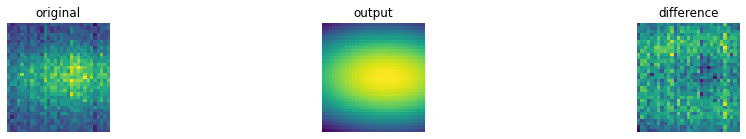

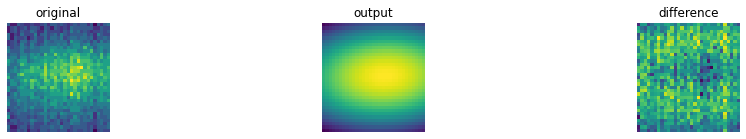

growth_17
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12085, 29, 32) (12085, 30, 44) (12085, 33, 31)
---------------spot 0 ----------------


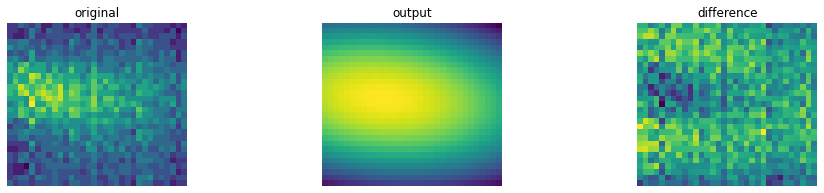

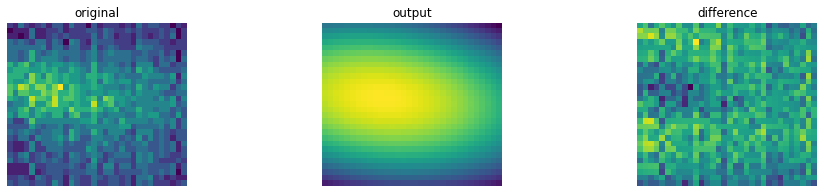

---------------spot 1 ----------------


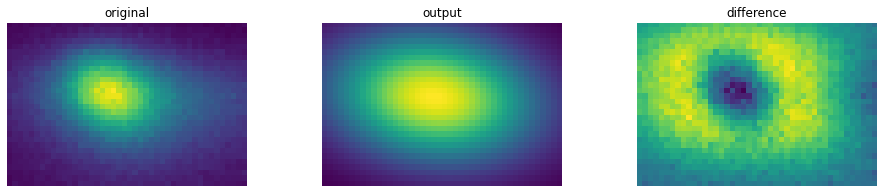

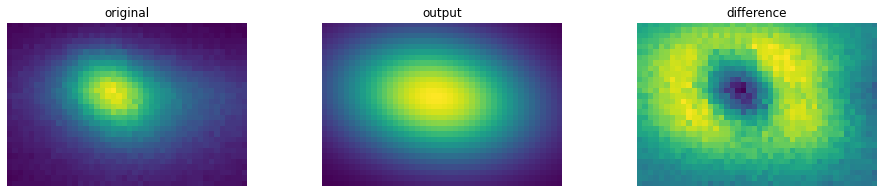

---------------spot 2 ----------------


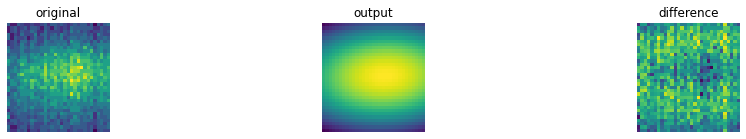

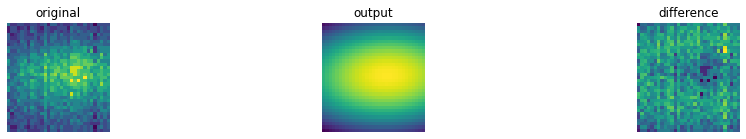

growth_18
<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>
(12113, 29, 32) (12113, 30, 44) (12113, 33, 31)
---------------spot 0 ----------------


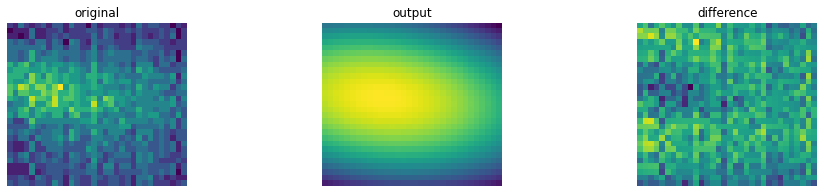

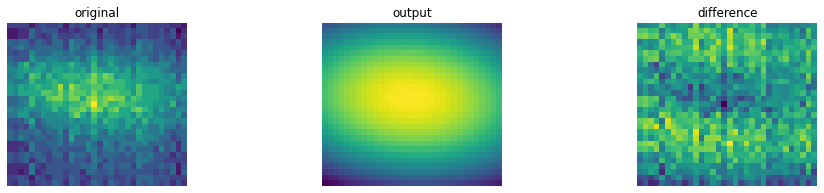

---------------spot 1 ----------------


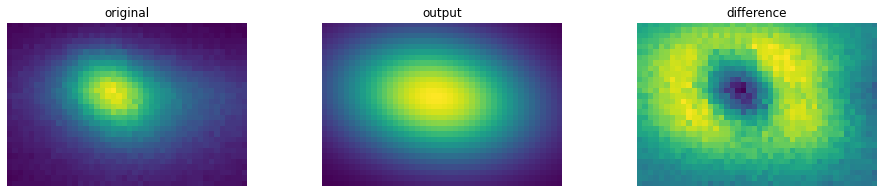

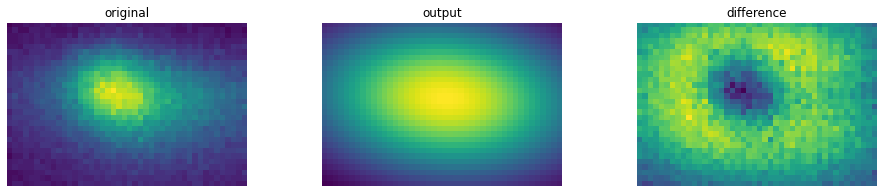

---------------spot 2 ----------------


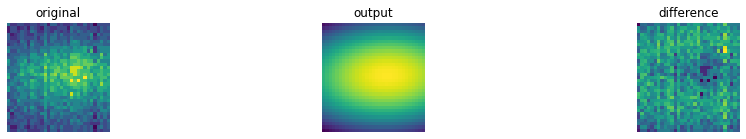

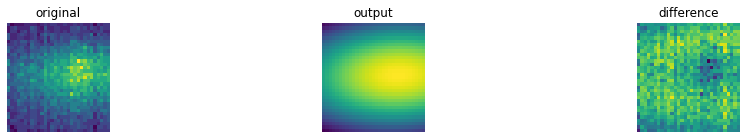

In [11]:
Parameters_file = '../data/test9_gaussian_fit_parameters_all.h5'
growth_titles = ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 
                 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 
                 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']
generate_parameter_file(RHEED_spot_file, Parameters_file, growth_titles, spot_p, show=True)

### 2.3.4 Upload parameter file to DataFed

In [3]:
import json # For dealing with metadata
import os # For file level operations
from datafed.CommandLib import API
df_api = API()

name = 'test9_gaussian_fit_parameters_all'

dc_resp = df_api.dataCreate(
                name,
                parent_id='c/393370045'  
                           )
rec_id = dc_resp[0].data[0].id
put_resp = df_api.dataPut(rec_id, # record id
                          './'+name+'.h5', # path to file
                          wait=True,  # Waitcas until transfer completes.
                          )
put_resp

(task {
   id: "task/402961845"
   type: TT_DATA_PUT
   status: TS_SUCCEEDED
   client: "u/yig319"
   step: 3
   steps: 4
   msg: "Finished"
   ct: 1657842467
   ut: 1657842586
   source: "lehigh#nhi-gpu/scratch/yichen/notebooks/RHEED/test6_gaussian_fit_parameters_all.h5"
   dest: "d/402961839"
 },
 'TaskDataReply')

In [17]:
name = '../data/test9_gaussian_fit_parameters_all.h5'
with h5py.File(name) as h5:
    print(h5.keys())

<KeysViewHDF5 ['background_with_heater', 'background_without_heater', 'growth_01', 'growth_02', 'growth_03', 'growth_04', 'growth_05', 'growth_06', 'growth_07', 'growth_08', 'growth_09', 'growth_10', 'growth_11', 'growth_12', 'growth_13', 'growth_14', 'growth_15', 'growth_16', 'growth_17', 'growth_18']>


# 3. 